# ViT-MAE — Multi-Anatomy MRI Anomaly Detection

This notebook trains **three ViT-Small MAE (Masked Autoencoder)** models for artifact detection:

| # | Anatomy | Dataset | Description |
|---|---------|---------|-------------|
| 1 | **Knee** | FastMRI (preprocessed) | Single anatomy, single contrast |
| 2 | **Brain** | IXI (balanced T1 + T2) | Single anatomy, balanced contrast |
| 3 | **Combined** | Both datasets merged | Multi-anatomy generalist model |

## Key Design Choices
- **ViT-Small/16 encoder** — 384-d, 12 layers, 6 heads (patch size 16 → 144 patches for 192×192)
- **75% masking ratio** — standard MAE; strong regularization, forces holistic understanding
- **Lightweight decoder** — 192-d, 4 layers, 3 heads (discarded after training)
- **Balanced brain sampling** — T1/T2 subsampled to match knee count; deterministic for reuse in DAE/DINO/PatchCore
- **Two anomaly scores** — reconstruction error (MAE-native) + kNN on encoder features

## Time Budget (~12h total)
| Phase | Est. Time |
|-------|----------|
| Knee (20 epochs + analysis) | ~2h |
| Brain (20 epochs + analysis) | ~2h |
| Combined (20 epochs + analysis) | ~4.5h |
| **Total** | **~8.5h** |

## Pipeline per Model
1. Train MAE (masked patch reconstruction, normalized MSE)
2. Extract L2-normalized 384-d encoder features (no masking)
3. Collapse check (feature STD + mean cosine similarity)
4. Reconstruction anomaly scoring (averaged over 10 random masks)
5. Feature-based kNN anomaly scoring (k=5, cosine distance)
6. Threshold analysis + score distributions
7. t-SNE embedding visualization
8. Reconstruction visualization (original → masked → reconstructed → error)
9. Nearest neighbor retrieval (qualitative)
10. Save checkpoints + zip for download

In [1]:
import os
import math
import time
import gc
import json
import numpy as np
import random
import matplotlib.pyplot as plt
import scipy.ndimage

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from tqdm import tqdm
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE

# ── Reproducibility ──
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)
if device == "cuda":
    print(torch.cuda.get_device_name(0))
    print(f"Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

Device: cuda
Tesla T4
Memory: 15.6 GB


## Hyperparameters

Optimized for MAE-based MRI anomaly detection:
- **LR 1.5e-4** — standard MAE base LR (scales as `base_lr × batch/256`); with effective batch 256 this is exact
- **Weight decay 0.05** — standard for ViT/MAE (much higher than ResNet; prevents overfitting transformer weights)
- **Betas (0.9, 0.95)** — standard MAE AdamW betas (lower β₂ than default 0.999; helps with loss spikes)
- **Mask ratio 0.75** — removes 75% of patches; forces the model to learn holistic structure, not local copying
- **Drop path 0.1** — stochastic depth for regularization on smaller dataset
- **20 epochs** — fits 3 models in 12h; MAE converges faster than SimCLR
- **Normalized MSE** — per-patch normalization improves feature quality (MAE paper finding)

In [2]:
# ══════════════════════════════════════════════
# Hyperparameters (shared across all 3 models)
# ══════════════════════════════════════════════
BATCH_SIZE     = 64
GRAD_ACCUM     = 4            # effective batch = 64 × 4 = 256
EPOCHS         = 20
BASE_LR        = 1.5e-4       # standard MAE LR for batch 256
WARMUP_EPOCHS  = 2
WEIGHT_DECAY   = 0.05         # standard ViT/MAE weight decay
BETAS          = (0.9, 0.95)  # standard MAE Adam betas

# MAE-specific
MASK_RATIO     = 0.75         # 75% masking (standard)
RECON_TRIALS   = 10           # random masks averaged per image for scoring

# ViT-Small encoder
IMG_SIZE       = 192
PATCH_SIZE     = 16           # 192/16 = 12 → 144 patches
ENC_DIM        = 384
ENC_DEPTH      = 12
ENC_HEADS      = 6
MLP_RATIO      = 4.0
DROP_PATH      = 0.1

# MAE decoder (lightweight)
DEC_DIM        = 192
DEC_DEPTH      = 4
DEC_HEADS      = 3

# Evaluation
K_NEIGHBORS    = 5
NUM_WORKERS    = 4
MAX_GRAD_NORM  = 1.0

NUM_PATCHES = (IMG_SIZE // PATCH_SIZE) ** 2  # 144

print(f"Effective batch size: {BATCH_SIZE * GRAD_ACCUM}")
print(f"Patches per image: {NUM_PATCHES} ({IMG_SIZE//PATCH_SIZE}×{IMG_SIZE//PATCH_SIZE})")
print(f"Visible patches (25%): {int(NUM_PATCHES * (1 - MASK_RATIO))}")
print(f"Masked patches (75%): {int(NUM_PATCHES * MASK_RATIO)}")
print(f"Epochs per model: {EPOCHS}")

Effective batch size: 256
Patches per image: 144 (12×12)
Visible patches (25%): 36
Masked patches (75%): 108
Epochs per model: 20


## Data Pipeline

### Balanced Brain Sampling

Brain has ~25,600 train slices (12,800 T1 + 12,800 T2) vs. Knee's ~12,864.
We **deterministically subsample** brain to match knee count:
- Sort all T1 paths alphabetically → pick evenly-spaced indices to get ~6,432
- Sort all T2 paths alphabetically → pick evenly-spaced indices to get ~6,432
- Total brain = ~12,864 = knee count

**Deterministic = reproducible**: the same `get_balanced_paths()` function used here
will produce the identical subset in DAE, DINO, and PatchCore notebooks.

### Augmentations

MAE uses **light augmentations** because 75% masking is already a very strong regularizer:
- Horizontal flip (50%)
- Small rotation ±10° (50%)
- Light intensity jitter (50%)

No heavy elastic/bias-field transforms needed — masking forces the model to learn
holistic structure without relying on local cues.

In [3]:
# ══════════════════════════════════════════════
# Balanced Sampling + Augmentations + Datasets
# ══════════════════════════════════════════════

def find_npy_files(root_dir):
    """Recursively find all .npy files. Returns (paths, label_strings)."""
    paths, labels = [], []
    for dirpath, _, filenames in os.walk(root_dir):
        npy_files = sorted(f for f in filenames if f.endswith('.npy'))
        if npy_files:
            folder_name = os.path.basename(dirpath)
            for f in npy_files:
                paths.append(os.path.join(dirpath, f))
                labels.append(folder_name)
    return paths, labels


def get_balanced_paths(root_dir, target_total=None):
    """Get .npy paths with optional balanced subsampling across subfolders.

    If target_total is None, returns ALL paths.
    If target_total is specified, evenly distributes across subfolders
    using deterministic evenly-spaced indices on sorted file lists.

    REPRODUCIBLE: use this same function in DAE/DINO/PatchCore notebooks
    to get the identical brain subset.
    """
    groups = {}
    for dirpath, _, filenames in os.walk(root_dir):
        npy_files = sorted(f for f in filenames if f.endswith('.npy'))
        if npy_files:
            folder = os.path.basename(dirpath)
            groups[folder] = [os.path.join(dirpath, f) for f in npy_files]

    if not groups:
        return [], []

    if target_total is None:
        paths, labels = [], []
        for folder in sorted(groups):
            paths.extend(groups[folder])
            labels.extend([folder] * len(groups[folder]))
        return paths, labels

    n_groups = len(groups)
    target_per_group = target_total // n_groups

    paths, labels = [], []
    for folder in sorted(groups):
        group_paths = groups[folder]
        if len(group_paths) <= target_per_group:
            selected = group_paths
        else:
            idx = np.round(np.linspace(0, len(group_paths) - 1, target_per_group)).astype(int)
            selected = [group_paths[i] for i in idx]
        paths.extend(selected)
        labels.extend([folder] * len(selected))
        print(f"    {folder}: {len(selected)}/{len(group_paths)} selected")

    return paths, labels


class MAEAugment:
    """Light augmentations for MAE training.
    75% masking is the main regularizer — no heavy transforms needed."""

    def __call__(self, img):
        img = img.copy()
        if random.random() < 0.5:
            img = np.flip(img, axis=1).copy()
        if random.random() < 0.5:
            angle = random.uniform(-10, 10)
            img = scipy.ndimage.rotate(img, angle, reshape=False, order=1, mode='reflect')
        if random.random() < 0.5:
            gain = random.uniform(0.9, 1.1)
            bias = random.uniform(-0.05, 0.05)
            img = img * gain + bias
        img = np.clip(img, 0.0, 1.0).astype(np.float32)
        return torch.from_numpy(img).unsqueeze(0)


class CleanTransform:
    """No augmentation — just convert to tensor."""
    def __call__(self, x):
        return torch.from_numpy(x).unsqueeze(0).float()


class MRIDataset(Dataset):
    """Generic MRI dataset from pre-selected paths."""
    def __init__(self, paths, labels, label_map, transform=None, name=""):
        self.paths = paths
        self.label_map = label_map
        self.labels = [label_map[l] for l in labels]
        self.transform = transform or CleanTransform()
        print(f"  [{name}] {len(paths)} slices | Labels: {label_map}")

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = np.load(self.paths[idx]).astype(np.float32)
        return self.transform(img), self.labels[idx]

## Model Architecture

### ViT-Small/16 Encoder
- Patch embedding: 1-channel → 384-d via Conv2d(1, 384, 16, 16)
- 12 transformer blocks with pre-norm, GELU MLP, drop-path
- Processes only **visible patches** (25%) during training → fast
- At inference (feature extraction): processes all 144 patches → 384-d mean-pooled output

### MAE Decoder (lightweight, discarded after training)
- Linear projection from encoder dim (384) to decoder dim (192)
- Learnable mask tokens inserted at masked positions
- 4 transformer blocks → linear projection to pixel space
- Predicts normalized pixel values for each masked patch

### Loss: Normalized MSE on Masked Patches
- Each target patch is normalized to zero mean, unit variance
- MSE computed only on masked patches (visible patches provide context)
- Per-patch normalization prevents high-variance patches from dominating

In [4]:
# ══════════════════════════════════════════════
# ViT-MAE Model
# ══════════════════════════════════════════════

class DropPath(nn.Module):
    """Stochastic depth (drop entire residual branch)."""
    def __init__(self, drop_prob=0.):
        super().__init__()
        self.drop_prob = drop_prob

    def forward(self, x):
        if not self.training or self.drop_prob == 0.:
            return x
        keep = 1 - self.drop_prob
        shape = (x.shape[0],) + (1,) * (x.ndim - 1)
        mask = torch.rand(shape, device=x.device) < keep
        return x / keep * mask


class Block(nn.Module):
    """Pre-norm Transformer block with drop path."""
    def __init__(self, dim, num_heads, mlp_ratio=4.0, drop_path=0.):
        super().__init__()
        self.norm1 = nn.LayerNorm(dim)
        self.attn = nn.MultiheadAttention(dim, num_heads, batch_first=True)
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.norm2 = nn.LayerNorm(dim)
        self.mlp = nn.Sequential(
            nn.Linear(dim, int(dim * mlp_ratio)),
            nn.GELU(),
            nn.Linear(int(dim * mlp_ratio), dim),
        )

    def forward(self, x):
        y = self.norm1(x)
        y, _ = self.attn(y, y, y, need_weights=False)
        x = x + self.drop_path(y)
        x = x + self.drop_path(self.mlp(self.norm2(x)))
        return x


class MAEViT(nn.Module):
    """Masked Autoencoder with ViT-Small encoder."""

    def __init__(self, img_size=192, patch_size=16, in_chans=1,
                 enc_dim=384, enc_depth=12, enc_heads=6,
                 dec_dim=192, dec_depth=4, dec_heads=3,
                 mlp_ratio=4.0, mask_ratio=0.75, drop_path_rate=0.1):
        super().__init__()
        self.patch_size = patch_size
        self.mask_ratio = mask_ratio
        self.num_patches = (img_size // patch_size) ** 2
        self.in_chans = in_chans

        # ── Encoder ──
        self.patch_embed = nn.Conv2d(in_chans, enc_dim,
                                     kernel_size=patch_size, stride=patch_size)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, enc_dim))
        self.pos_embed = nn.Parameter(torch.zeros(1, self.num_patches + 1, enc_dim))

        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, enc_depth)]
        self.encoder_blocks = nn.ModuleList([
            Block(enc_dim, enc_heads, mlp_ratio, drop_path=dpr[i])
            for i in range(enc_depth)
        ])
        self.encoder_norm = nn.LayerNorm(enc_dim)

        # ── Decoder ──
        self.decoder_embed = nn.Linear(enc_dim, dec_dim)
        self.mask_token = nn.Parameter(torch.zeros(1, 1, dec_dim))
        self.decoder_pos_embed = nn.Parameter(
            torch.zeros(1, self.num_patches + 1, dec_dim))

        self.decoder_blocks = nn.ModuleList([
            Block(dec_dim, dec_heads, mlp_ratio, drop_path=0.)
            for _ in range(dec_depth)
        ])
        self.decoder_norm = nn.LayerNorm(dec_dim)
        self.decoder_pred = nn.Linear(dec_dim, patch_size ** 2 * in_chans)

        self._init_weights()

    def _init_weights(self):
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        nn.init.trunc_normal_(self.decoder_pos_embed, std=0.02)
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.mask_token, std=0.02)
        self.apply(self._init_module_weights)

    @staticmethod
    def _init_module_weights(m):
        if isinstance(m, nn.Linear):
            nn.init.trunc_normal_(m.weight, std=0.02)
            if m.bias is not None:
                nn.init.zeros_(m.bias)
        elif isinstance(m, nn.LayerNorm):
            nn.init.ones_(m.weight)
            nn.init.zeros_(m.bias)

    def patchify(self, imgs):
        """(B, C, H, W) → (B, N, patch_size²×C)"""
        p = self.patch_size
        B, C, H, W = imgs.shape
        h, w = H // p, W // p
        x = imgs.reshape(B, C, h, p, w, p)
        return x.permute(0, 2, 4, 1, 3, 5).reshape(B, h * w, p * p * C)

    def unpatchify(self, x):
        """(B, N, patch_size²×C) → (B, C, H, W)"""
        p = self.patch_size
        h = w = int(x.shape[1] ** 0.5)
        C = self.in_chans
        x = x.reshape(-1, h, w, C, p, p)
        return x.permute(0, 3, 1, 4, 2, 5).reshape(-1, C, h * p, w * p)

    def random_masking(self, x, mask_ratio):
        """Random per-sample masking. Returns visible tokens, binary mask, restore indices."""
        B, N, D = x.shape
        len_keep = int(N * (1 - mask_ratio))

        noise = torch.rand(B, N, device=x.device)
        ids_shuffle = torch.argsort(noise, dim=1)
        ids_restore = torch.argsort(ids_shuffle, dim=1)

        ids_keep = ids_shuffle[:, :len_keep]
        x_visible = torch.gather(x, 1, ids_keep.unsqueeze(-1).expand(-1, -1, D))

        mask = torch.ones(B, N, device=x.device)
        mask[:, :len_keep] = 0
        mask = torch.gather(mask, 1, ids_restore)  # 1=masked, 0=visible

        return x_visible, mask, ids_restore

    def forward_encoder(self, x, mask_ratio=None):
        if mask_ratio is None:
            mask_ratio = self.mask_ratio

        x = self.patch_embed(x).flatten(2).transpose(1, 2)  # (B, N, D)
        x = x + self.pos_embed[:, 1:, :]

        if mask_ratio > 0:
            x, mask, ids_restore = self.random_masking(x, mask_ratio)
        else:
            B, N, _ = x.shape
            mask = torch.zeros(B, N, device=x.device)
            ids_restore = torch.arange(N, device=x.device).unsqueeze(0).expand(B, -1)

        cls = (self.cls_token + self.pos_embed[:, :1, :]).expand(x.shape[0], -1, -1)
        x = torch.cat([cls, x], dim=1)

        for blk in self.encoder_blocks:
            x = blk(x)
        x = self.encoder_norm(x)

        return x, mask, ids_restore

    def forward_decoder(self, x, ids_restore):
        x = self.decoder_embed(x)

        mask_tokens = self.mask_token.repeat(
            x.shape[0], ids_restore.shape[1] + 1 - x.shape[1], 1)
        x_ = torch.cat([x[:, 1:, :], mask_tokens], dim=1)
        x_ = torch.gather(x_, 1,
                          ids_restore.unsqueeze(-1).expand(-1, -1, x_.shape[2]))
        x = torch.cat([x[:, :1, :], x_], dim=1)  # prepend CLS

        x = x + self.decoder_pos_embed
        for blk in self.decoder_blocks:
            x = blk(x)
        x = self.decoder_norm(x)
        x = self.decoder_pred(x)

        return x[:, 1:, :]  # remove CLS → (B, N, patch_pixels)

    def forward(self, imgs, mask_ratio=None):
        """Returns (batch_loss, per_image_loss, pred, mask)."""
        latent, mask, ids_restore = self.forward_encoder(imgs, mask_ratio)
        pred = self.forward_decoder(latent, ids_restore)

        target = self.patchify(imgs)
        # Per-patch normalization (MAE paper recommendation)
        mean = target.mean(dim=-1, keepdim=True)
        var = target.var(dim=-1, keepdim=True)
        target_norm = (target - mean) / (var + 1e-6).sqrt()

        loss = (pred - target_norm) ** 2
        loss = loss.mean(dim=-1)  # (B, N)

        loss_per_img = (loss * mask).sum(dim=1) / mask.sum(dim=1).clamp(min=1)
        loss_batch = (loss * mask).sum() / mask.sum().clamp(min=1)

        return loss_batch, loss_per_img, pred, mask

    @torch.no_grad()
    def extract_features(self, imgs):
        """All-patch encoder features (no masking). Returns (B, enc_dim)."""
        latent, _, _ = self.forward_encoder(imgs, mask_ratio=0)
        return latent[:, 1:, :].mean(dim=1)  # mean pool patch tokens

    @torch.no_grad()
    def reconstruct_for_viz(self, imgs, mask_ratio=None):
        """Returns (masked_img, recon_img, mask) in pixel space for visualization."""
        latent, mask, ids_restore = self.forward_encoder(imgs, mask_ratio)
        pred = self.forward_decoder(latent, ids_restore)

        target = self.patchify(imgs)
        mean = target.mean(dim=-1, keepdim=True)
        var = target.var(dim=-1, keepdim=True)
        pred_pixels = pred * (var + 1e-6).sqrt() + mean  # denormalize

        mask_2d = mask.unsqueeze(-1).expand_as(target)
        visible = target * (1 - mask_2d)
        recon = target * (1 - mask_2d) + pred_pixels * mask_2d

        return self.unpatchify(visible), self.unpatchify(recon), mask


def count_params(model):
    return sum(p.numel() for p in model.parameters())


# Quick architecture check
_m = MAEViT(IMG_SIZE, PATCH_SIZE, 1, ENC_DIM, ENC_DEPTH, ENC_HEADS,
            DEC_DIM, DEC_DEPTH, DEC_HEADS, MLP_RATIO, MASK_RATIO, DROP_PATH)
print(f"Encoder params: {count_params(_m) - count_params(_m.decoder_blocks) - count_params(_m.decoder_embed) - count_params(_m.decoder_norm) - count_params(_m.decoder_pred):,}")
print(f"Decoder params: {count_params(_m.decoder_blocks) + count_params(_m.decoder_embed) + count_params(_m.decoder_norm) + count_params(_m.decoder_pred) + _m.mask_token.numel() + _m.decoder_pos_embed.numel():,}")
print(f"Total params: {count_params(_m):,} ({count_params(_m)/1e6:.1f}M)")
del _m

Encoder params: 21,477,120
Decoder params: 1,931,200
Total params: 23,380,288 (23.4M)


## Training & Evaluation Infrastructure

- `train_epoch()` — forward + backward with gradient accumulation, grad clipping, mixed precision
- `eval_epoch()` — validation loss (no grad)
- `extract_all_features()` — L2-normalized encoder features from clean data (no masking)
- `compute_recon_scores()` — reconstruction anomaly scores averaged over multiple random masks
- `train_mae()` — full training loop with logging, checkpoints, time budget
- `run_full_analysis()` — complete evaluation (collapse check, kNN, reconstruction, t-SNE, plots)
- `clear_gpu()` — free GPU memory between runs

In [5]:
# ══════════════════════════════════════════════
# Training Infrastructure
# ══════════════════════════════════════════════
TOTAL_TIME_BUDGET = 12 * 3600
SESSION_START = time.time()


def log_time_budget(phase=""):
    elapsed = time.time() - SESSION_START
    remaining = TOTAL_TIME_BUDGET - elapsed
    print(f"⏱ [{phase}] Elapsed: {elapsed/3600:.2f}h | Remaining: {remaining/3600:.2f}h "
          f"| Budget used: {100*elapsed/TOTAL_TIME_BUDGET:.1f}%")
    if remaining < 1800:
        print("  ⚠️ WARNING: Less than 30 min remaining!")
    return remaining


def log_gpu_memory(prefix=""):
    if device == "cuda":
        alloc = torch.cuda.memory_allocated() / 1e9
        peak = torch.cuda.max_memory_allocated() / 1e9
        total = torch.cuda.get_device_properties(0).total_memory / 1e9
        print(f"  🖥 GPU [{prefix}]: {alloc:.2f}/{total:.1f} GB (peak: {peak:.2f} GB)")


def clear_gpu():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.reset_peak_memory_stats()
    log_gpu_memory("after clear")
    log_time_budget("GPU cleared")


def train_epoch(model, loader, optimizer, scaler):
    model.train()
    total_loss = 0.0
    num_batches = len(loader)
    log_interval = max(1, num_batches // 5)
    optimizer.zero_grad()
    epoch_start = time.time()

    for step, (imgs, _) in enumerate(loader):
        imgs = imgs.to(device)
        with torch.amp.autocast("cuda", enabled=(device == "cuda")):
            loss_batch, _, _, _ = model(imgs)
            loss = loss_batch / GRAD_ACCUM

        scaler.scale(loss).backward()

        if (step + 1) % GRAD_ACCUM == 0 or (step + 1) == num_batches:
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), MAX_GRAD_NORM)
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

        total_loss += loss_batch.item()

        if (step + 1) % log_interval == 0:
            avg = total_loss / (step + 1)
            elapsed = time.time() - epoch_start
            rate = (step + 1) / elapsed
            eta = (num_batches - step - 1) / rate
            print(f"    batch {step+1}/{num_batches} | loss={avg:.4f} | "
                  f"{rate:.1f} batch/s | ETA: {eta:.0f}s", end="\r")

    print(" " * 80, end="\r")
    return total_loss / num_batches


@torch.no_grad()
def eval_epoch(model, loader):
    model.eval()
    total_loss = 0.0
    for imgs, _ in loader:
        imgs = imgs.to(device)
        with torch.amp.autocast("cuda", enabled=(device == "cuda")):
            loss_batch, _, _, _ = model(imgs)
        total_loss += loss_batch.item()
    return total_loss / len(loader)


@torch.no_grad()
def extract_all_features(model, loader):
    """Extract L2-normalized encoder features (no masking)."""
    model.eval()
    feats, labels = [], []
    for imgs, y in tqdm(loader, desc="Extracting features"):
        imgs = imgs.to(device)
        with torch.amp.autocast("cuda", enabled=(device == "cuda")):
            f = model.extract_features(imgs).float()
        f = F.normalize(f, dim=1)
        feats.append(f.cpu().numpy())
        labels.append(y.numpy())
    return np.concatenate(feats), np.concatenate(labels)


@torch.no_grad()
def compute_recon_scores(model, loader, num_trials=10):
    """Reconstruction anomaly score: average per-image loss over multiple random masks."""
    model.eval()
    all_scores = []
    for imgs, _ in tqdm(loader, desc="Recon scoring"):
        imgs = imgs.to(device)
        batch_scores = torch.zeros(imgs.shape[0], device=device)
        for _ in range(num_trials):
            with torch.amp.autocast("cuda", enabled=(device == "cuda")):
                _, per_img, _, _ = model(imgs)
            batch_scores += per_img.float()
        batch_scores /= num_trials
        all_scores.append(batch_scores.cpu().numpy())
    return np.concatenate(all_scores)

In [6]:
# ══════════════════════════════════════════════
# Full Training Loop
# ══════════════════════════════════════════════
def train_mae(train_loader, val_loader, save_dir, model_name="MAE"):
    os.makedirs(save_dir, exist_ok=True)

    remaining = log_time_budget(f"START {model_name}")
    if remaining < 3600:
        print("  ⚠️ CRITICAL: Less than 1h remaining!")

    print(f"\n{'='*60}")
    print(f"  🚀 Training: {model_name}")
    print(f"  📁 Save dir: {save_dir}")
    print(f"  📊 Train: {len(train_loader)} batches | Val: {len(val_loader)} batches")
    print(f"  ⚙️  Config: {EPOCHS}ep, BS={BATCH_SIZE}, accum={GRAD_ACCUM}, "
          f"mask={MASK_RATIO}, LR={BASE_LR}")
    print(f"{'='*60}\n")

    model = MAEViT(
        IMG_SIZE, PATCH_SIZE, 1,
        ENC_DIM, ENC_DEPTH, ENC_HEADS,
        DEC_DIM, DEC_DEPTH, DEC_HEADS,
        MLP_RATIO, MASK_RATIO, DROP_PATH,
    ).to(device)

    print(f"  Parameters: {count_params(model):,} ({count_params(model)/1e6:.1f}M)")
    log_gpu_memory("model loaded")

    # AdamW with MAE-standard betas
    optimizer = torch.optim.AdamW(
        model.parameters(), lr=BASE_LR,
        weight_decay=WEIGHT_DECAY, betas=BETAS,
    )

    def lr_lambda(epoch):
        if epoch < WARMUP_EPOCHS:
            return (epoch + 1) / WARMUP_EPOCHS
        progress = (epoch - WARMUP_EPOCHS) / max(EPOCHS - WARMUP_EPOCHS, 1)
        return 0.5 * (1.0 + math.cos(math.pi * progress))

    scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)
    scaler = torch.amp.GradScaler("cuda", enabled=(device == "cuda"))

    history = {"train_loss": [], "val_loss": [], "lr": [], "epoch_time": []}
    best_val_loss = float("inf")
    total_start = time.time()

    for epoch in range(EPOCHS):
        epoch_start = time.time()

        t_loss = train_epoch(model, train_loader, optimizer, scaler)
        v_loss = eval_epoch(model, val_loader)
        scheduler.step()

        epoch_time = time.time() - epoch_start
        lr_now = scheduler.get_last_lr()[0]
        history["train_loss"].append(t_loss)
        history["val_loss"].append(v_loss)
        history["lr"].append(lr_now)
        history["epoch_time"].append(epoch_time)

        elapsed_model = time.time() - total_start
        elapsed_session = time.time() - SESSION_START
        remaining_session = TOTAL_TIME_BUDGET - elapsed_session

        print(f"  [{model_name}] Epoch {epoch+1:2d}/{EPOCHS} │ "
              f"train={t_loss:.4f} val={v_loss:.4f} │ lr={lr_now:.6f} │ "
              f"{epoch_time:.0f}s/ep │ model: {elapsed_model/60:.1f}min │ "
              f"budget left: {remaining_session/3600:.2f}h")

        if v_loss < best_val_loss:
            best_val_loss = v_loss
            torch.save({"epoch": epoch + 1, "model": model.state_dict(),
                        "optimizer": optimizer.state_dict(), "val_loss": v_loss},
                       os.path.join(save_dir, "best.pt"))
            print(f"       ↑ New best! (val_loss={v_loss:.4f})")

        if (epoch + 1) % 5 == 0:
            torch.save({"epoch": epoch + 1, "model": model.state_dict()},
                       os.path.join(save_dir, f"epoch_{epoch+1}.pt"))
            print(f"       💾 Checkpoint: epoch_{epoch+1}.pt")
            log_gpu_memory(f"epoch {epoch+1}")

        if remaining_session < 1800 and epoch < EPOCHS - 1:
            print(f"  ⚠️ TIME: {remaining_session/60:.0f} min left! Stopping at epoch {epoch+1}.")
            break

    total_time = time.time() - total_start
    torch.save({"epoch": epoch + 1, "model": model.state_dict(),
                "history": history}, os.path.join(save_dir, "final.pt"))

    print(f"\n  ✅ {model_name} complete in {total_time/60:.1f} min ({total_time/3600:.2f}h)")
    print(f"     Best val loss: {best_val_loss:.4f}")
    print(f"     Avg epoch time: {np.mean(history['epoch_time']):.1f}s")
    log_time_budget(f"END {model_name}")

    # Load best
    best = torch.load(os.path.join(save_dir, "best.pt"), map_location=device)
    model.load_state_dict(best["model"])

    return model, history

In [7]:
# ══════════════════════════════════════════════
# Full Analysis Pipeline
# ══════════════════════════════════════════════
def run_full_analysis(model, train_loader, val_loader,
                      val_dataset, history, save_dir, model_name):
    analysis_start = time.time()
    log_time_budget(f"ANALYSIS START {model_name}")

    print(f"\n{'='*60}")
    print(f"  📈 Analysis: {model_name}")
    print(f"{'='*60}")

    # ── 1. Training Curves ──
    print("\n[1/12] Training curves...")
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f"{model_name} — Training Curves", fontsize=14, y=1.02)
    axes[0].plot(history['train_loss'], label='Train', linewidth=2)
    axes[0].plot(history['val_loss'], label='Val', linewidth=2)
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('MSE Loss')
    axes[0].set_title('Loss'); axes[0].legend(); axes[0].grid(True, alpha=0.3)
    axes[1].plot(history['lr'], linewidth=2, color='green')
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('LR')
    axes[1].set_title('Learning Rate'); axes[1].grid(True, alpha=0.3)
    gap = [v - t for t, v in zip(history['train_loss'], history['val_loss'])]
    axes[2].plot(gap, linewidth=2, color='red')
    axes[2].axhline(0, color='gray', ls='--', alpha=0.5)
    axes[2].set_xlabel('Epoch'); axes[2].set_ylabel('Val - Train')
    axes[2].set_title('Generalization Gap'); axes[2].grid(True, alpha=0.3)
    fig.tight_layout()
    fig.savefig(os.path.join(save_dir, 'training_curves.png'), dpi=150, bbox_inches='tight')
    plt.show()

    # ── 2. Reconstruction Visualization ──
    print("[2/12] Reconstruction visualization...")
    model.eval()
    sample_imgs, _ = next(iter(val_loader))
    sample_imgs = sample_imgs[:4].to(device)
    masked_imgs, recon_imgs, mask = model.reconstruct_for_viz(sample_imgs)

    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    fig.suptitle(f"{model_name} — Reconstruction (75% masked)", fontsize=14, y=1.01)
    for row in range(4):
        orig = sample_imgs[row, 0].cpu().numpy()
        msk = masked_imgs[row, 0].cpu().numpy()
        rec = recon_imgs[row, 0].cpu().clamp(0, 1).numpy()
        err = np.abs(orig - rec)
        for col, (img, title) in enumerate([
            (orig, 'Original'), (msk, 'Masked (25% visible)'),
            (rec, 'Reconstructed'), (err, 'Error')
        ]):
            ax = axes[row][col]
            cmap = 'hot' if col == 3 else 'gray'
            vmax = err.max() * 1.5 if col == 3 else 1
            ax.imshow(img, cmap=cmap, vmin=0, vmax=vmax)
            if row == 0: ax.set_title(title, fontsize=12)
            ax.axis('off')
    fig.tight_layout()
    fig.savefig(os.path.join(save_dir, 'reconstruction_viz.png'), dpi=150, bbox_inches='tight')
    plt.show()

    # ── 3. Feature Extraction ──
    print("[3/12] Extracting encoder features (no masking)...")
    feat_start = time.time()
    train_feats, train_labels = extract_all_features(model, train_loader)
    val_feats, val_labels = extract_all_features(model, val_loader)
    print(f"  Train: {train_feats.shape}, Val: {val_feats.shape} ({time.time()-feat_start:.1f}s)")

    # ── 4. Collapse Check ──
    print("[4/12] Collapse check...")
    n_check = min(2000, len(train_feats))
    for name, feats in [('Train', train_feats[:n_check]), ('Val', val_feats[:n_check])]:
        std = np.std(feats, axis=0).mean()
        sim = np.dot(feats, feats.T)
        off = sim[np.triu_indices_from(sim, k=1)]
        s_std = '✅' if std > 0.01 else '⚠️ COLLAPSE'
        s_sim = '✅' if off.mean() < 0.9 else '⚠️ HIGH'
        print(f"  {name}: STD={std:.4f} {s_std} | Mean cos sim={off.mean():.4f} {s_sim}")

    # ── 5. Reconstruction Anomaly Scores ──
    print(f"[5/12] Reconstruction anomaly scores ({RECON_TRIALS} trials)...")
    recon_start = time.time()
    train_recon = compute_recon_scores(model, train_loader, RECON_TRIALS)
    val_recon = compute_recon_scores(model, val_loader, RECON_TRIALS)
    print(f"  Train recon — mean: {train_recon.mean():.4f}, std: {train_recon.std():.4f}")
    print(f"  Val recon   — mean: {val_recon.mean():.4f}, std: {val_recon.std():.4f}")
    print(f"  ({time.time()-recon_start:.1f}s)")

    # ── 6. Feature kNN Anomaly Scores ──
    print("[6/12] Feature kNN anomaly scores...")
    nn_model = NearestNeighbors(n_neighbors=K_NEIGHBORS, metric='cosine')
    nn_model.fit(train_feats)
    train_knn = nn_model.kneighbors(train_feats)[0].mean(axis=1)
    val_knn = nn_model.kneighbors(val_feats)[0].mean(axis=1)
    print(f"  Train kNN — mean: {train_knn.mean():.4f}, std: {train_knn.std():.4f}")
    print(f"  Val kNN   — mean: {val_knn.mean():.4f}, std: {val_knn.std():.4f}")

    # ── 7. Score Distributions ──
    print("[7/12] Score distributions...")
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle(f"{model_name} — Anomaly Score Distributions", fontsize=14, y=1.02)
    axes[0][0].hist(train_recon, bins=60, alpha=0.7, color='steelblue', edgecolor='white')
    axes[0][0].set_title('Train — Reconstruction'); axes[0][0].set_xlabel('MSE')
    axes[0][1].hist(val_recon, bins=60, alpha=0.7, color='coral', edgecolor='white')
    axes[0][1].set_title('Val — Reconstruction'); axes[0][1].set_xlabel('MSE')
    axes[1][0].hist(train_knn, bins=60, alpha=0.7, color='steelblue', edgecolor='white')
    axes[1][0].set_title('Train — kNN Distance'); axes[1][0].set_xlabel('Cosine Dist')
    axes[1][1].hist(val_knn, bins=60, alpha=0.7, color='coral', edgecolor='white')
    axes[1][1].set_title('Val — kNN Distance'); axes[1][1].set_xlabel('Cosine Dist')
    fig.tight_layout()
    fig.savefig(os.path.join(save_dir, 'anomaly_scores.png'), dpi=150, bbox_inches='tight')
    plt.show()

    # ── 8. Threshold Analysis ──
    print("[8/12] Threshold analysis...")
    print("  Reconstruction-based:")
    for pct in [90, 95, 97.5, 99]:
        thresh = np.percentile(train_recon, pct)
        flagged = (val_recon > thresh).sum()
        print(f"    p{pct}: thresh={thresh:.4f} → {flagged}/{len(val_recon)} val flagged "
              f"({100*flagged/len(val_recon):.1f}%)")
    print("  kNN-based:")
    for pct in [90, 95, 97.5, 99]:
        thresh = np.percentile(train_knn, pct)
        flagged = (val_knn > thresh).sum()
        print(f"    p{pct}: thresh={thresh:.4f} → {flagged}/{len(val_knn)} val flagged "
              f"({100*flagged/len(val_knn):.1f}%)")

    # ── 9. t-SNE ──
    print("[9/12] t-SNE...")
    tsne_start = time.time()
    N_TSNE = min(3000, len(val_feats))
    tsne = TSNE(n_components=2, perplexity=30, random_state=SEED, max_iter=1000)
    emb = tsne.fit_transform(val_feats[:N_TSNE])
    labels_sub = val_labels[:N_TSNE]
    recon_sub = val_recon[:N_TSNE]
    knn_sub = val_knn[:N_TSNE]
    print(f"  t-SNE done ({time.time()-tsne_start:.1f}s)")

    fig, axes = plt.subplots(1, 4, figsize=(24, 6))
    fig.suptitle(f"{model_name} — t-SNE Embeddings", fontsize=14, y=1.02)
    axes[0].scatter(emb[:, 0], emb[:, 1], s=3, alpha=0.5, c='steelblue')
    axes[0].set_title('Unsupervised'); axes[0].set_xticks([]); axes[0].set_yticks([])
    sc1 = axes[1].scatter(emb[:, 0], emb[:, 1], s=3, alpha=0.5, c=labels_sub, cmap='coolwarm')
    axes[1].set_title('By Label'); axes[1].set_xticks([]); axes[1].set_yticks([])
    plt.colorbar(sc1, ax=axes[1], shrink=0.8)
    sc2 = axes[2].scatter(emb[:, 0], emb[:, 1], s=3, alpha=0.5, c=recon_sub, cmap='YlOrRd')
    axes[2].set_title('Recon Score'); axes[2].set_xticks([]); axes[2].set_yticks([])
    plt.colorbar(sc2, ax=axes[2], shrink=0.8)
    sc3 = axes[3].scatter(emb[:, 0], emb[:, 1], s=3, alpha=0.5, c=knn_sub, cmap='YlOrRd')
    axes[3].set_title('kNN Score'); axes[3].set_xticks([]); axes[3].set_yticks([])
    plt.colorbar(sc3, ax=axes[3], shrink=0.8)
    fig.tight_layout()
    fig.savefig(os.path.join(save_dir, 'tsne.png'), dpi=150, bbox_inches='tight')
    plt.show()

    # ── 10. Cosine Similarity Distribution ──
    print("[10/12] Cosine similarity distribution...")
    subset = torch.tensor(val_feats[:2000])
    sim_matrix = torch.mm(subset, subset.T).numpy()
    upper_tri = sim_matrix[np.triu_indices_from(sim_matrix, k=1)]
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.hist(upper_tri, bins=100, color='mediumpurple', edgecolor='white', alpha=0.8)
    ax.axvline(upper_tri.mean(), color='red', ls='--', label=f'Mean: {upper_tri.mean():.3f}')
    ax.set_title(f"{model_name} — Pairwise Cosine Similarity")
    ax.set_xlabel('Cosine Similarity'); ax.legend()
    fig.tight_layout()
    fig.savefig(os.path.join(save_dir, 'similarity_dist.png'), dpi=150, bbox_inches='tight')
    plt.show()

    # ── 11. NN Retrieval ──
    print("[11/12] Nearest neighbor retrieval...")
    nn_vis = NearestNeighbors(n_neighbors=6, metric='cosine').fit(val_feats)
    indices = random.sample(range(len(val_feats)), 3)
    fig, axes = plt.subplots(3, 6, figsize=(15, 7.5))
    fig.suptitle(f"{model_name} — NN Retrieval", fontsize=14, y=1.02)
    for row, q_idx in enumerate(indices):
        _, nn_idxs = nn_vis.kneighbors([val_feats[q_idx]])
        for col, idx in enumerate(nn_idxs[0]):
            img = np.load(val_dataset.paths[idx])
            axes[row][col].imshow(img, cmap='gray', vmin=0, vmax=1)
            axes[row][col].axis('off')
            axes[row][col].set_title('Query' if col == 0 else f'NN-{col}', fontsize=9)
    fig.tight_layout()
    fig.savefig(os.path.join(save_dir, 'nn_retrieval.png'), dpi=150, bbox_inches='tight')
    plt.show()

    # ── 12. Top Anomalies ──
    print("[12/12] Top anomalies...")
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    fig.suptitle(f"{model_name} — Top-10 Anomalies (by recon error)", fontsize=14)
    top_idx = np.argsort(val_recon)[-10:][::-1]
    for i, idx in enumerate(top_idx):
        ax = axes[i // 5][i % 5]
        img = np.load(val_dataset.paths[idx])
        ax.imshow(img, cmap='gray', vmin=0, vmax=1)
        ax.set_title(f'R={val_recon[idx]:.3f}\nK={val_knn[idx]:.4f}', fontsize=8)
        ax.axis('off')
    fig.tight_layout()
    fig.savefig(os.path.join(save_dir, 'top_anomalies.png'), dpi=150, bbox_inches='tight')
    plt.show()

    # ── Save ──
    np.savez(
        os.path.join(save_dir, 'scoring.npz'),
        train_recon=train_recon, val_recon=val_recon,
        train_knn=train_knn, val_knn=val_knn,
        train_feats=train_feats, val_feats=val_feats,
        train_labels=train_labels, val_labels=val_labels,
        threshold_recon_p95=np.percentile(train_recon, 95),
        threshold_knn_p95=np.percentile(train_knn, 95),
    )

    print(f"\n  ✅ Analysis complete in {(time.time()-analysis_start)/60:.1f} min")
    print(f"  📁 Files: {os.listdir(save_dir)}")
    log_time_budget(f"ANALYSIS END {model_name}")

    return train_feats, val_feats, train_recon, val_recon, train_knn, val_knn

In [8]:
# ══════════════════════════════════════════════
# Discover dataset paths
# ══════════════════════════════════════════════
KNEE_ROOT = "/kaggle/input/datasets/kaustubhratna/fast-mri-preprocessed-kaust"
BRAIN_ROOT = "/kaggle/input/datasets/kaustubhratna/preprocessed-ixi-brain"

def show_tree(path, prefix="", max_depth=3, depth=0):
    if depth >= max_depth:
        return
    try:
        entries = sorted(os.listdir(path))
    except (PermissionError, FileNotFoundError) as e:
        print(f"{prefix}⚠️ {e}")
        return
    dirs = [e for e in entries if os.path.isdir(os.path.join(path, e))]
    files = [e for e in entries if os.path.isfile(os.path.join(path, e))]
    if files:
        npy = [f for f in files if f.endswith('.npy')]
        if npy:
            print(f"{prefix}📄 {len(npy)} .npy files (e.g., {npy[0]})")
        for f in [x for x in files if not x.endswith('.npy')][:3]:
            print(f"{prefix}📄 {f}")
    for d in dirs:
        print(f"{prefix}📁 {d}/")
        show_tree(os.path.join(path, d), prefix + "    ", max_depth, depth + 1)

print("=" * 50)
print("KNEE Dataset:")
print("=" * 50)
show_tree(KNEE_ROOT)

print(f"\n{'='*50}")
print("BRAIN Dataset:")
print("=" * 50)
show_tree(BRAIN_ROOT)

KNEE Dataset:
📁 train/
    📁 KNEE/
        📄 12864 .npy files (e.g., file1000031_slice_000.npy)
📁 val/
    📁 KNEE/
        📄 3264 .npy files (e.g., file1000114_slice_000.npy)

BRAIN Dataset:
📁 train/
    📁 T1/
        📄 12800 .npy files (e.g., IXI016-Guys-0697-IXI3DMPRAG_-s231_-0301-00003-000001-01_slice_000.npy)
    📁 T2/
        📄 12800 .npy files (e.g., IXI012-HH-1211-fMRIDE3Diso_-s3T111_-0401-00004-000002-02_slice_000.npy)
📁 val/
    📁 T1/
        📄 3200 .npy files (e.g., IXI044-Guys-0712-IXI3DMPRAG_-s235_-0301-00003-000001-01_slice_000.npy)
    📁 T2/
        📄 3200 .npy files (e.g., IXI027-Guys-0710-IXIT2WTS_-s234_-0501-00005-000002-02_slice_000.npy)


In [9]:
# ══════════════════════════════════════════════
# Configure Paths + Balanced Brain Sampling
# ══════════════════════════════════════════════
# ⚠️ UPDATE THESE based on the directory tree output above
KNEE_TRAIN = os.path.join(KNEE_ROOT, "train")
KNEE_VAL   = os.path.join(KNEE_ROOT, "val")
BRAIN_TRAIN = os.path.join(BRAIN_ROOT, "train")
BRAIN_VAL   = os.path.join(BRAIN_ROOT, "val")

# Get all knee paths (no subsampling)
print("Knee (all):")
knee_train_paths, knee_train_labels = get_balanced_paths(KNEE_TRAIN)
knee_val_paths, knee_val_labels = get_balanced_paths(KNEE_VAL)
print(f"  Train: {len(knee_train_paths)} | Val: {len(knee_val_paths)}")

# Balanced brain sampling → match knee count
print(f"\nBrain (balanced to match knee = {len(knee_train_paths)}):")
print("  Train:")
brain_train_paths, brain_train_labels = get_balanced_paths(
    BRAIN_TRAIN, target_total=len(knee_train_paths))
print("  Val:")
brain_val_paths, brain_val_labels = get_balanced_paths(
    BRAIN_VAL, target_total=len(knee_val_paths))
print(f"  Train: {len(brain_train_paths)} | Val: {len(brain_val_paths)}")

# Build label maps
knee_label_map = {l: i for i, l in enumerate(sorted(set(knee_train_labels)))}
brain_label_map = {l: i for i, l in enumerate(sorted(set(brain_train_labels)))}

# Combined label map (global)
all_labels = sorted(set(knee_train_labels + brain_train_labels))
combined_label_map = {l: i for i, l in enumerate(all_labels)}

print(f"\nLabel maps:")
print(f"  Knee: {knee_label_map}")
print(f"  Brain: {brain_label_map}")
print(f"  Combined: {combined_label_map}")

# Save balanced selection for reproducibility in other notebooks
selection = {
    "brain_train_paths": brain_train_paths,
    "brain_val_paths": brain_val_paths,
    "knee_train_count": len(knee_train_paths),
    "knee_val_count": len(knee_val_paths),
}
os.makedirs("checkpoints", exist_ok=True)
with open("checkpoints/balanced_brain_selection.json", "w") as f:
    json.dump(selection, f, indent=2)
print("\n✅ Balanced selection saved to checkpoints/balanced_brain_selection.json")
print("   (Use this in DAE/DINO/PatchCore for identical brain subset)")

Knee (all):
  Train: 12864 | Val: 3264

Brain (balanced to match knee = 12864):
  Train:
    T1: 6432/12800 selected
    T2: 6432/12800 selected
  Val:
    T1: 1632/3200 selected
    T2: 1632/3200 selected
  Train: 12864 | Val: 3264

Label maps:
  Knee: {'KNEE': 0}
  Brain: {'T1': 0, 'T2': 1}
  Combined: {'KNEE': 0, 'T1': 1, 'T2': 2}

✅ Balanced selection saved to checkpoints/balanced_brain_selection.json
   (Use this in DAE/DINO/PatchCore for identical brain subset)


---
# Part 1: Knee Only (FastMRI)

Train ViT-MAE on **knee MRI slices only**. Single anatomy, single contrast.
- ~12,864 train slices
- Baseline for homogeneous data performance

In [10]:
# ══════════════════════════════════════════════
# PART 1: KNEE — Data Loaders
# ══════════════════════════════════════════════
print("Loading Knee datasets...")
aug = MAEAugment()

knee_train_ds = MRIDataset(knee_train_paths, knee_train_labels, knee_label_map,
                           transform=aug, name="Knee-Train")
knee_val_ds = MRIDataset(knee_val_paths, knee_val_labels, knee_label_map,
                         transform=aug, name="Knee-Val")

knee_train_loader = DataLoader(knee_train_ds, batch_size=BATCH_SIZE, shuffle=True,
                               num_workers=NUM_WORKERS, pin_memory=True, drop_last=True)
knee_val_loader = DataLoader(knee_val_ds, batch_size=BATCH_SIZE, shuffle=False,
                             num_workers=NUM_WORKERS, pin_memory=True)

# Clean loaders for feature extraction
knee_train_clean = MRIDataset(knee_train_paths, knee_train_labels, knee_label_map,
                              name="Knee-Train-Clean")
knee_val_clean = MRIDataset(knee_val_paths, knee_val_labels, knee_label_map,
                            name="Knee-Val-Clean")

knee_train_clean_loader = DataLoader(knee_train_clean, batch_size=BATCH_SIZE, shuffle=False,
                                     num_workers=NUM_WORKERS, pin_memory=True)
knee_val_clean_loader = DataLoader(knee_val_clean, batch_size=BATCH_SIZE, shuffle=False,
                                   num_workers=NUM_WORKERS, pin_memory=True)

sample = np.load(knee_train_ds.paths[0])
print(f"\nSample: shape={sample.shape}, range=[{sample.min():.3f}, {sample.max():.3f}]")

Loading Knee datasets...
  [Knee-Train] 12864 slices | Labels: {'KNEE': 0}
  [Knee-Val] 3264 slices | Labels: {'KNEE': 0}
  [Knee-Train-Clean] 12864 slices | Labels: {'KNEE': 0}
  [Knee-Val-Clean] 3264 slices | Labels: {'KNEE': 0}

Sample: shape=(192, 192), range=[0.000, 1.000]


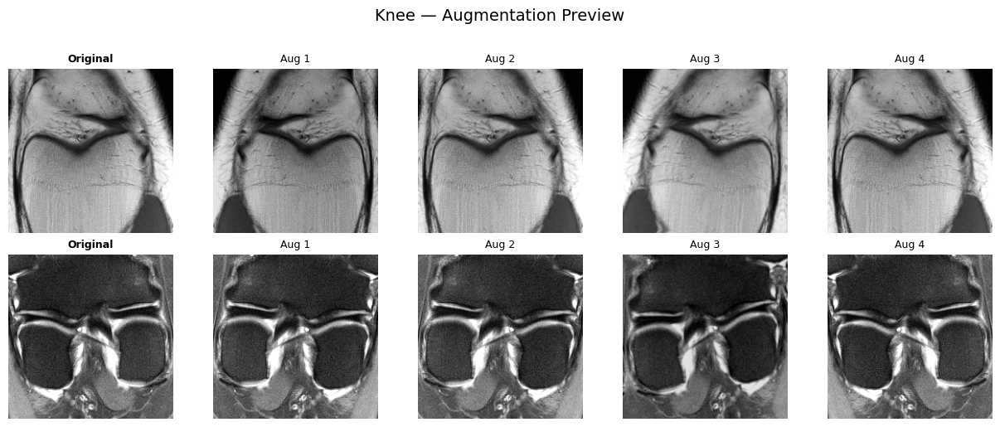

In [11]:
# ══════════════════════════════════════════════
# PART 1: KNEE — Preview
# ══════════════════════════════════════════════
fig, axes = plt.subplots(2, 5, figsize=(12.5, 5))
fig.suptitle("Knee — Augmentation Preview", fontsize=14, y=1.02)
for row in range(2):
    idx = random.randint(0, len(knee_train_clean) - 1)
    raw = np.load(knee_train_clean.paths[idx]).astype(np.float32)
    axes[row][0].imshow(raw, cmap='gray', vmin=0, vmax=1)
    axes[row][0].set_title('Original', fontweight='bold', fontsize=9)
    axes[row][0].axis('off')
    for col in range(1, 5):
        v = aug(raw)
        axes[row][col].imshow(v[0], cmap='gray', vmin=0, vmax=1)
        axes[row][col].set_title(f'Aug {col}', fontsize=9)
        axes[row][col].axis('off')
fig.tight_layout()
plt.show()

In [12]:
# ══════════════════════════════════════════════
# PART 1: KNEE — Train MAE
# ══════════════════════════════════════════════
KNEE_SAVE = "/kaggle/working/checkpoints/mae_knee"
knee_model, knee_history = train_mae(
    knee_train_loader, knee_val_loader, KNEE_SAVE, model_name="MAE-Knee")

⏱ [START MAE-Knee] Elapsed: 0.06h | Remaining: 11.94h | Budget used: 0.5%

  🚀 Training: MAE-Knee
  📁 Save dir: /kaggle/working/checkpoints/mae_knee
  📊 Train: 201 batches | Val: 51 batches
  ⚙️  Config: 20ep, BS=64, accum=4, mask=0.75, LR=0.00015

  Parameters: 23,380,288 (23.4M)
  🖥 GPU [model loaded]: 0.09/15.6 GB (peak: 0.09 GB)
  [MAE-Knee] Epoch  1/20 │ train=0.9945 val=0.9900 │ lr=0.000150 │ 47s/ep │ model: 0.8min │ budget left: 11.93h
       ↑ New best! (val_loss=0.9900)
  [MAE-Knee] Epoch  2/20 │ train=0.9889 val=0.9893 │ lr=0.000150 │ 21s/ep │ model: 1.1min │ budget left: 11.92h
       ↑ New best! (val_loss=0.9893)
  [MAE-Knee] Epoch  3/20 │ train=0.9842 val=0.9803 │ lr=0.000149 │ 21s/ep │ model: 1.5min │ budget left: 11.92h
       ↑ New best! (val_loss=0.9803)
  [MAE-Knee] Epoch  4/20 │ train=0.9751 val=0.9757 │ lr=0.000145 │ 21s/ep │ model: 1.8min │ budget left: 11.91h
       ↑ New best! (val_loss=0.9757)
  [MAE-Knee] Epoch  5/20 │ train=0.9699 val=0.9705 │ lr=0.000140 │ 21

⏱ [ANALYSIS START MAE-Knee] Elapsed: 0.19h | Remaining: 11.81h | Budget used: 1.6%

  📈 Analysis: MAE-Knee

[1/12] Training curves...


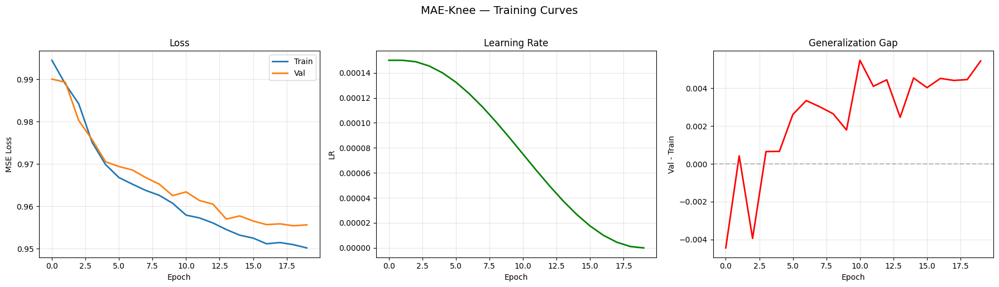

[2/12] Reconstruction visualization...


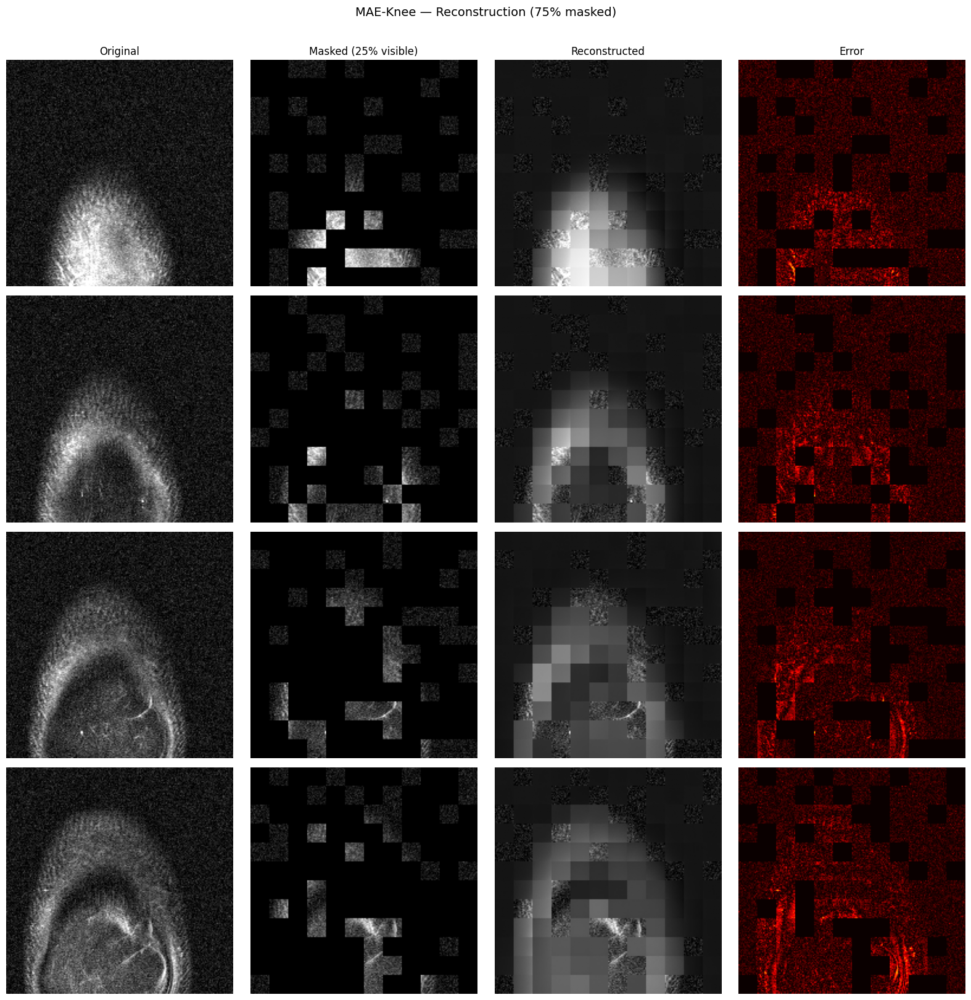

[3/12] Extracting encoder features (no masking)...


Extracting features: 100%|██████████| 51/51 [00:02<00:00, 18.25it/s]


  Train: (12864, 384), Val: (3264, 384) (13.2s)
[4/12] Collapse check...
  Train: STD=0.0417 ✅ | Mean cos sim=0.2814 ✅
  Val: STD=0.0404 ✅ | Mean cos sim=0.3246 ✅
[5/12] Reconstruction anomaly scores (10 trials)...


Recon scoring: 100%|██████████| 51/51 [00:11<00:00,  4.32it/s]


  Train recon — mean: 0.9564, std: 0.0304
  Val recon   — mean: 0.9606, std: 0.0309
  (57.9s)
[6/12] Feature kNN anomaly scores...
  Train kNN — mean: 0.0122, std: 0.0100
  Val kNN   — mean: 0.0165, std: 0.0136
[7/12] Score distributions...


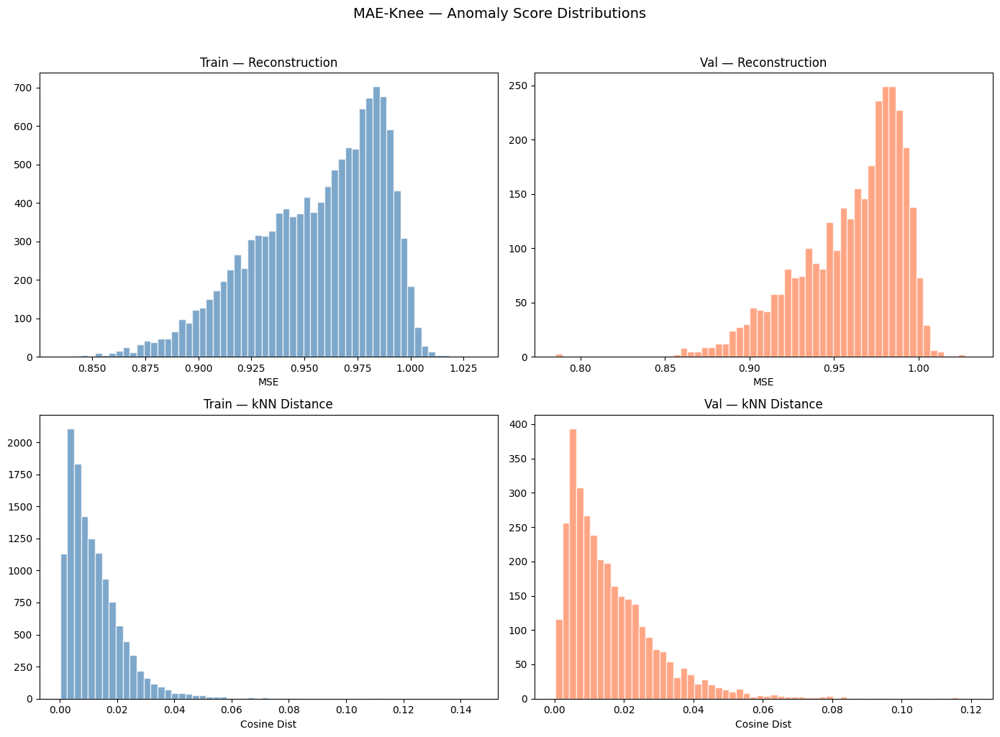

[8/12] Threshold analysis...
  Reconstruction-based:
    p90: thresh=0.9906 → 450/3264 val flagged (13.8%)
    p95: thresh=0.9951 → 238/3264 val flagged (7.3%)
    p97.5: thresh=0.9985 → 131/3264 val flagged (4.0%)
    p99: thresh=1.0019 → 55/3264 val flagged (1.7%)
  kNN-based:
    p90: thresh=0.0244 → 681/3264 val flagged (20.9%)
    p95: thresh=0.0304 → 417/3264 val flagged (12.8%)
    p97.5: thresh=0.0371 → 249/3264 val flagged (7.6%)
    p99: thresh=0.0475 → 105/3264 val flagged (3.2%)
[9/12] t-SNE...
  t-SNE done (14.1s)


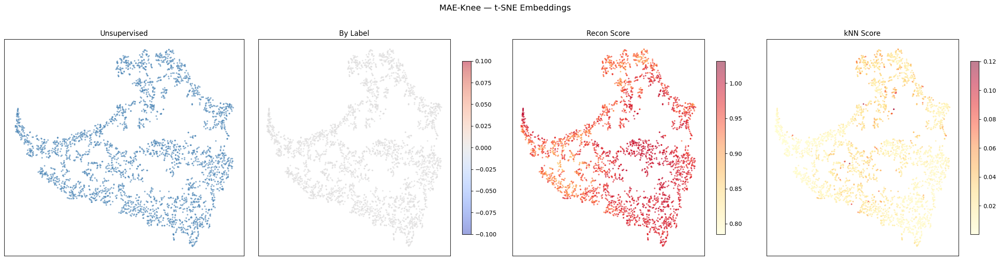

[10/12] Cosine similarity distribution...


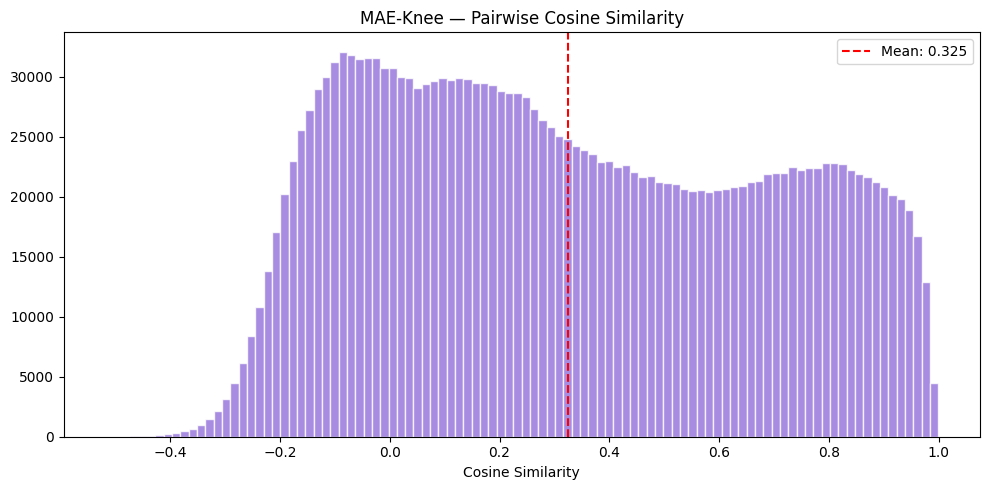

[11/12] Nearest neighbor retrieval...


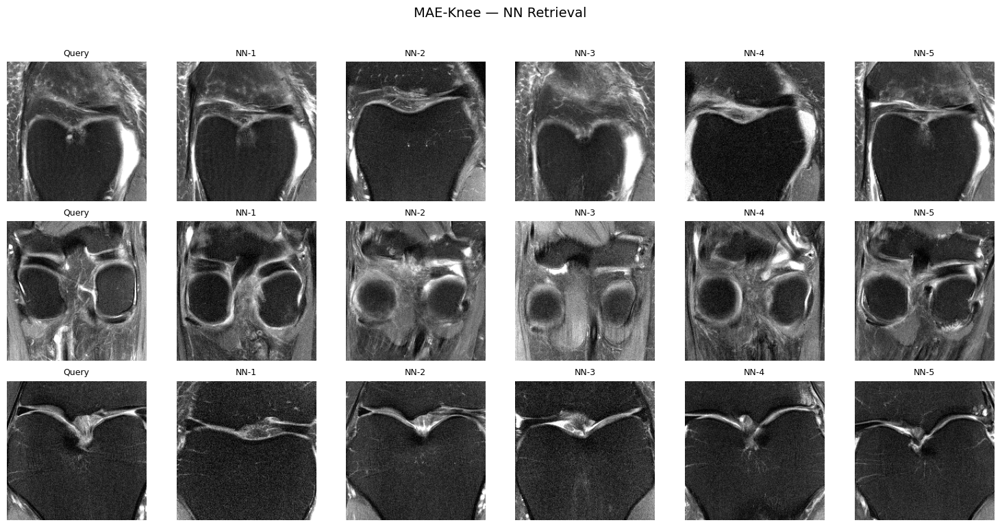

[12/12] Top anomalies...


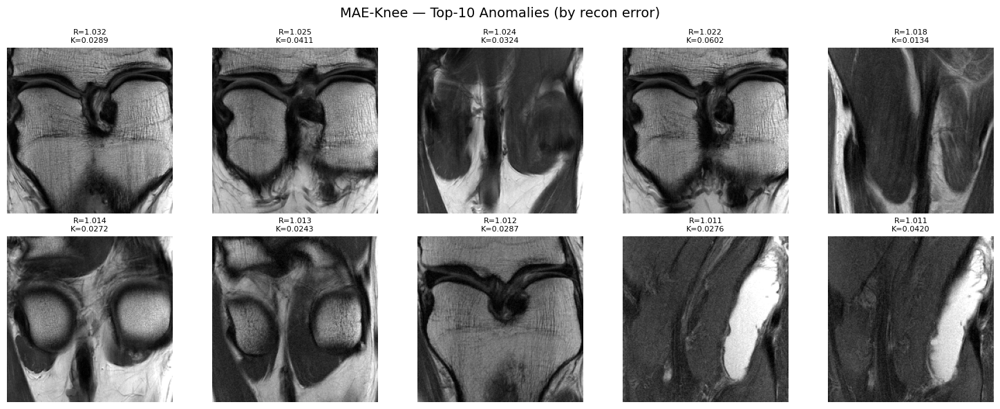


  ✅ Analysis complete in 1.7 min
  📁 Files: ['anomaly_scores.png', 'epoch_20.pt', 'top_anomalies.png', 'training_curves.png', 'similarity_dist.png', 'epoch_15.pt', 'nn_retrieval.png', 'epoch_5.pt', 'scoring.npz', 'epoch_10.pt', 'reconstruction_viz.png', 'best.pt', 'final.pt', 'tsne.png']
⏱ [ANALYSIS END MAE-Knee] Elapsed: 0.22h | Remaining: 11.78h | Budget used: 1.8%


In [13]:
# ══════════════════════════════════════════════
# PART 1: KNEE — Full Analysis
# ══════════════════════════════════════════════
knee_results = run_full_analysis(
    knee_model, knee_train_clean_loader, knee_val_clean_loader,
    knee_val_clean, knee_history, KNEE_SAVE, "MAE-Knee")

In [14]:
# ══════════════════════════════════════════════
# PART 1: KNEE — Cleanup
# ══════════════════════════════════════════════
del knee_model
del knee_train_loader, knee_val_loader
del knee_train_clean_loader, knee_val_clean_loader
clear_gpu()

  🖥 GPU [after clear]: 0.02/15.6 GB (peak: 0.02 GB)
⏱ [GPU cleared] Elapsed: 0.22h | Remaining: 11.78h | Budget used: 1.8%


---
# Part 2: Brain Only (IXI — Balanced T1 + T2)

Train ViT-MAE on **balanced brain MRI slices** (~6,432 T1 + ~6,432 T2 = ~12,864 total).
- Matched to knee count for fair comparison
- Deterministic selection for reproducibility across notebooks
- Two modalities (T1/T2) with very different contrast profiles

In [15]:
# ══════════════════════════════════════════════
# PART 2: BRAIN — Data Loaders (balanced)
# ══════════════════════════════════════════════
print("Loading Brain datasets (balanced)...")
aug = MAEAugment()

brain_train_ds = MRIDataset(brain_train_paths, brain_train_labels, brain_label_map,
                            transform=aug, name="Brain-Train")
brain_val_ds = MRIDataset(brain_val_paths, brain_val_labels, brain_label_map,
                          transform=aug, name="Brain-Val")

brain_train_loader = DataLoader(brain_train_ds, batch_size=BATCH_SIZE, shuffle=True,
                                num_workers=NUM_WORKERS, pin_memory=True, drop_last=True)
brain_val_loader = DataLoader(brain_val_ds, batch_size=BATCH_SIZE, shuffle=False,
                              num_workers=NUM_WORKERS, pin_memory=True)

brain_train_clean = MRIDataset(brain_train_paths, brain_train_labels, brain_label_map,
                               name="Brain-Train-Clean")
brain_val_clean = MRIDataset(brain_val_paths, brain_val_labels, brain_label_map,
                             name="Brain-Val-Clean")

brain_train_clean_loader = DataLoader(brain_train_clean, batch_size=BATCH_SIZE, shuffle=False,
                                      num_workers=NUM_WORKERS, pin_memory=True)
brain_val_clean_loader = DataLoader(brain_val_clean, batch_size=BATCH_SIZE, shuffle=False,
                                    num_workers=NUM_WORKERS, pin_memory=True)

print(f"\nBrain train: {len(brain_train_ds)} slices, {len(brain_train_loader)} batches")
print(f"Brain val:   {len(brain_val_ds)} slices, {len(brain_val_loader)} batches")

Loading Brain datasets (balanced)...
  [Brain-Train] 12864 slices | Labels: {'T1': 0, 'T2': 1}
  [Brain-Val] 3264 slices | Labels: {'T1': 0, 'T2': 1}
  [Brain-Train-Clean] 12864 slices | Labels: {'T1': 0, 'T2': 1}
  [Brain-Val-Clean] 3264 slices | Labels: {'T1': 0, 'T2': 1}

Brain train: 12864 slices, 201 batches
Brain val:   3264 slices, 51 batches


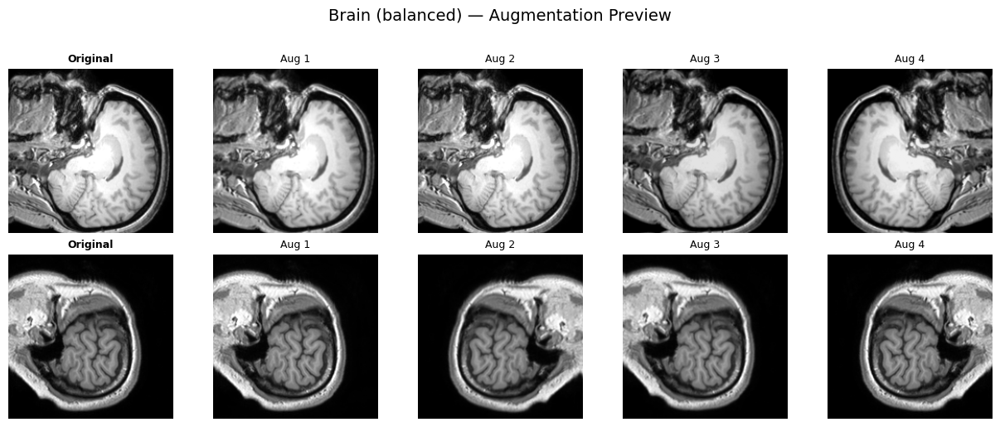

In [16]:
# ══════════════════════════════════════════════
# PART 2: BRAIN — Preview
# ══════════════════════════════════════════════
fig, axes = plt.subplots(2, 5, figsize=(12.5, 5))
fig.suptitle("Brain (balanced) — Augmentation Preview", fontsize=14, y=1.02)
for row in range(2):
    idx = random.randint(0, len(brain_train_clean) - 1)
    raw = np.load(brain_train_clean.paths[idx]).astype(np.float32)
    axes[row][0].imshow(raw, cmap='gray', vmin=0, vmax=1)
    axes[row][0].set_title('Original', fontweight='bold', fontsize=9)
    axes[row][0].axis('off')
    for col in range(1, 5):
        v = aug(raw)
        axes[row][col].imshow(v[0], cmap='gray', vmin=0, vmax=1)
        axes[row][col].set_title(f'Aug {col}', fontsize=9)
        axes[row][col].axis('off')
fig.tight_layout()
plt.show()

In [17]:
# ══════════════════════════════════════════════
# PART 2: BRAIN — Train MAE
# ══════════════════════════════════════════════
BRAIN_SAVE = "/kaggle/working/checkpoints/mae_brain"
brain_model, brain_history = train_mae(
    brain_train_loader, brain_val_loader, BRAIN_SAVE, model_name="MAE-Brain")

⏱ [START MAE-Brain] Elapsed: 0.22h | Remaining: 11.78h | Budget used: 1.8%

  🚀 Training: MAE-Brain
  📁 Save dir: /kaggle/working/checkpoints/mae_brain
  📊 Train: 201 batches | Val: 51 batches
  ⚙️  Config: 20ep, BS=64, accum=4, mask=0.75, LR=0.00015

  Parameters: 23,380,288 (23.4M)
  🖥 GPU [model loaded]: 0.11/15.6 GB (peak: 0.11 GB)
  [MAE-Brain] Epoch  1/20 │ train=0.9203 val=0.9157 │ lr=0.000150 │ 56s/ep │ model: 0.9min │ budget left: 11.77h
       ↑ New best! (val_loss=0.9157)
  [MAE-Brain] Epoch  2/20 │ train=0.8948 val=0.8722 │ lr=0.000150 │ 21s/ep │ model: 1.3min │ budget left: 11.76h
       ↑ New best! (val_loss=0.8722)
  [MAE-Brain] Epoch  3/20 │ train=0.8647 val=0.8629 │ lr=0.000149 │ 21s/ep │ model: 1.7min │ budget left: 11.76h
       ↑ New best! (val_loss=0.8629)
  [MAE-Brain] Epoch  4/20 │ train=0.8552 val=0.8527 │ lr=0.000145 │ 21s/ep │ model: 2.0min │ budget left: 11.75h
       ↑ New best! (val_loss=0.8527)
  [MAE-Brain] Epoch  5/20 │ train=0.8467 val=0.8471 │ lr=0.000

⏱ [ANALYSIS START MAE-Brain] Elapsed: 0.35h | Remaining: 11.65h | Budget used: 2.9%

  📈 Analysis: MAE-Brain

[1/12] Training curves...


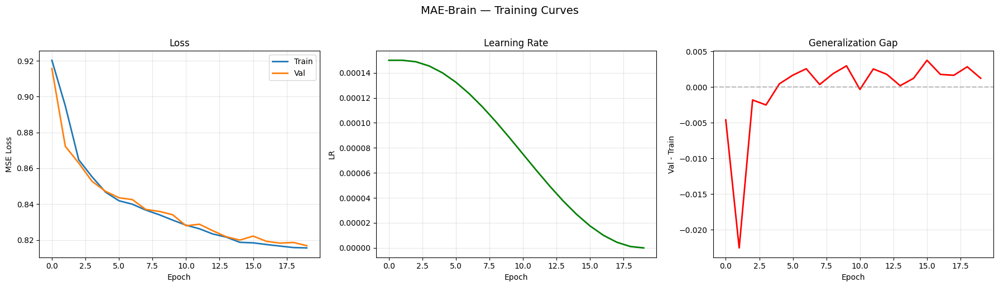

[2/12] Reconstruction visualization...


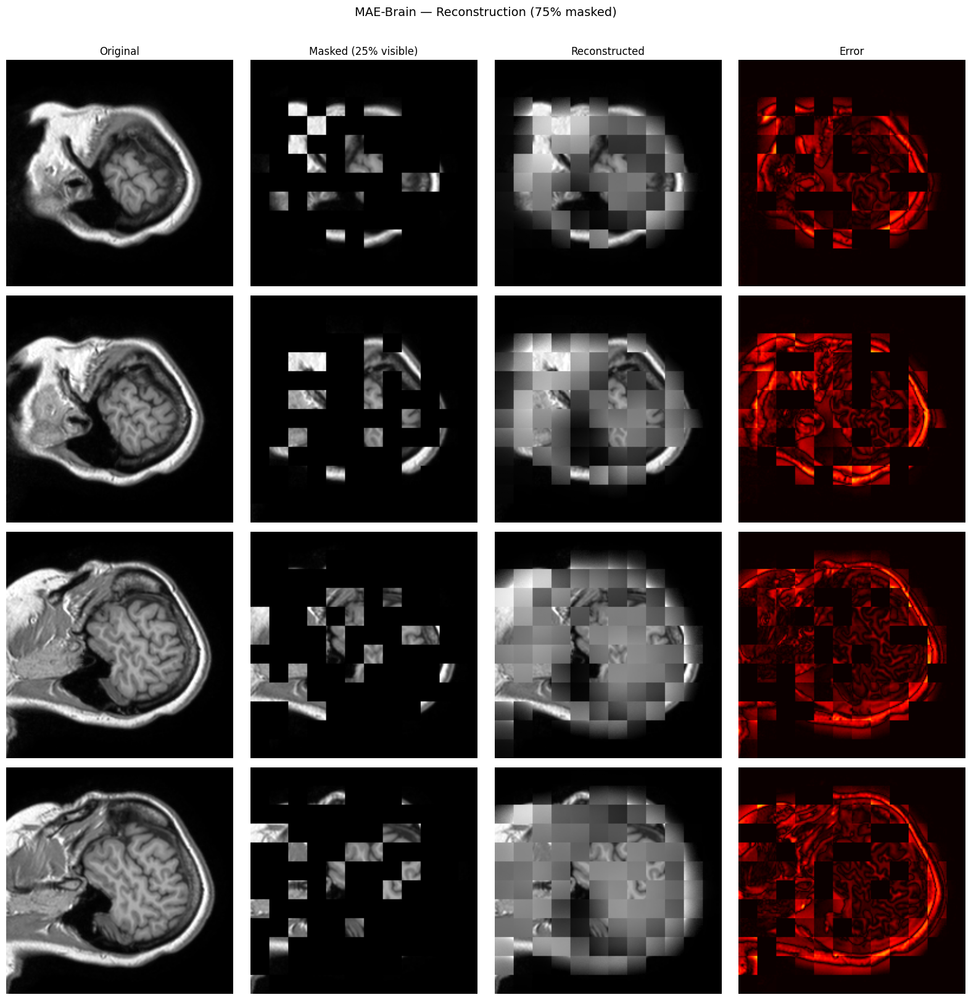

[3/12] Extracting encoder features (no masking)...


Extracting features: 100%|██████████| 51/51 [00:02<00:00, 18.18it/s]


  Train: (12864, 384), Val: (3264, 384) (13.0s)
[4/12] Collapse check...
  Train: STD=0.0358 ✅ | Mean cos sim=0.4417 ✅
  Val: STD=0.0407 ✅ | Mean cos sim=0.3089 ✅
[5/12] Reconstruction anomaly scores (10 trials)...


Recon scoring: 100%|██████████| 51/51 [00:11<00:00,  4.36it/s]


  Train recon — mean: 0.8332, std: 0.0677
  Val recon   — mean: 0.8358, std: 0.0670
  (57.4s)
[6/12] Feature kNN anomaly scores...
  Train kNN — mean: 0.0072, std: 0.0067
  Val kNN   — mean: 0.0148, std: 0.0295
[7/12] Score distributions...


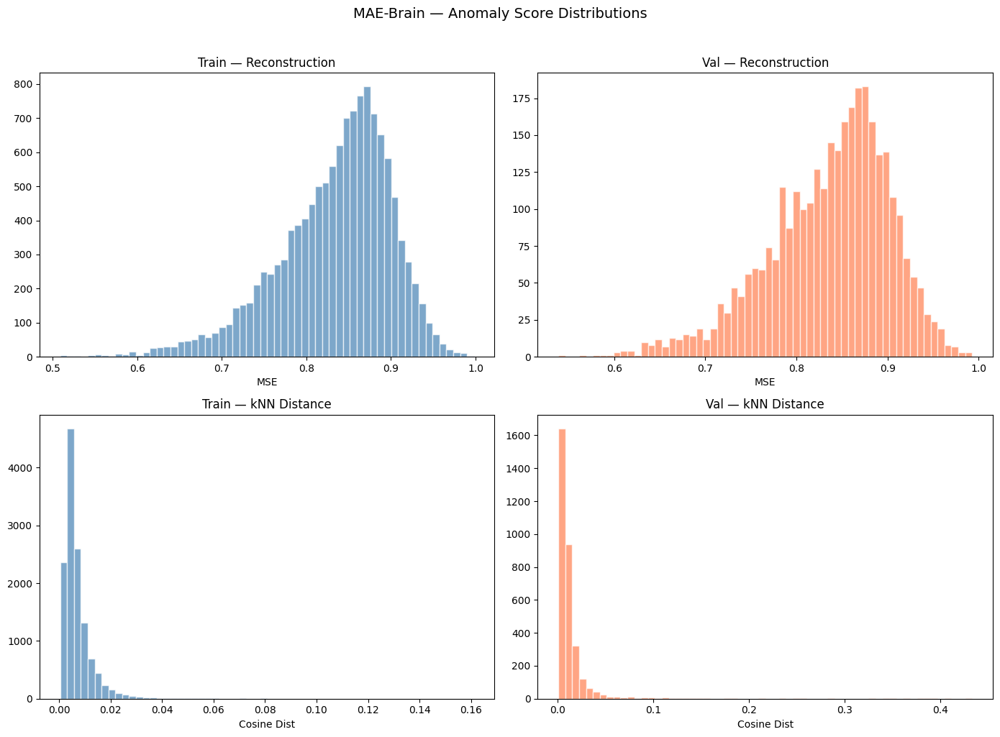

[8/12] Threshold analysis...
  Reconstruction-based:
    p90: thresh=0.9075 → 385/3264 val flagged (11.8%)
    p95: thresh=0.9242 → 195/3264 val flagged (6.0%)
    p97.5: thresh=0.9368 → 113/3264 val flagged (3.5%)
    p99: thresh=0.9530 → 47/3264 val flagged (1.4%)
  kNN-based:
    p90: thresh=0.0134 → 869/3264 val flagged (26.6%)
    p95: thresh=0.0178 → 544/3264 val flagged (16.7%)
    p97.5: thresh=0.0232 → 353/3264 val flagged (10.8%)
    p99: thresh=0.0338 → 198/3264 val flagged (6.1%)
[9/12] t-SNE...
  t-SNE done (11.8s)


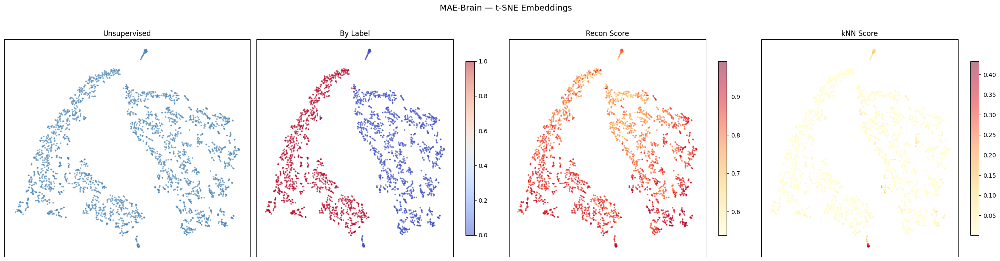

[10/12] Cosine similarity distribution...


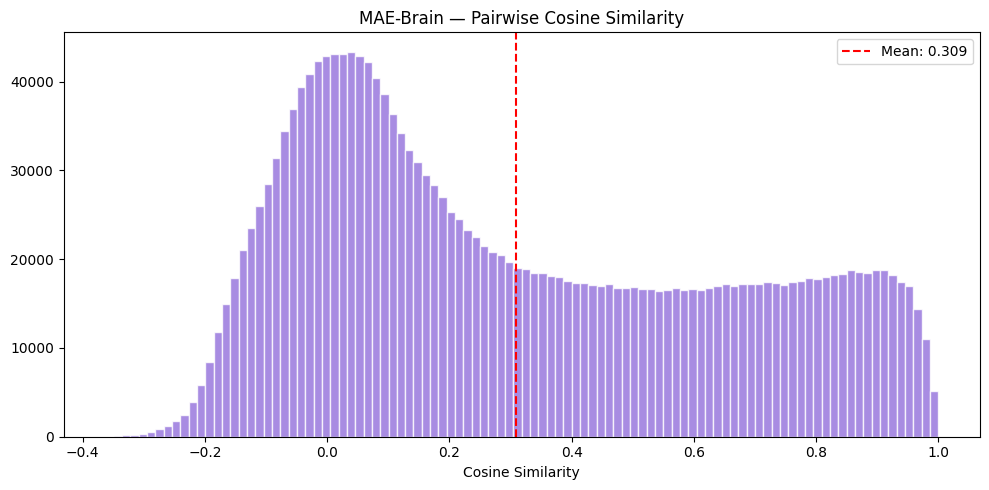

[11/12] Nearest neighbor retrieval...


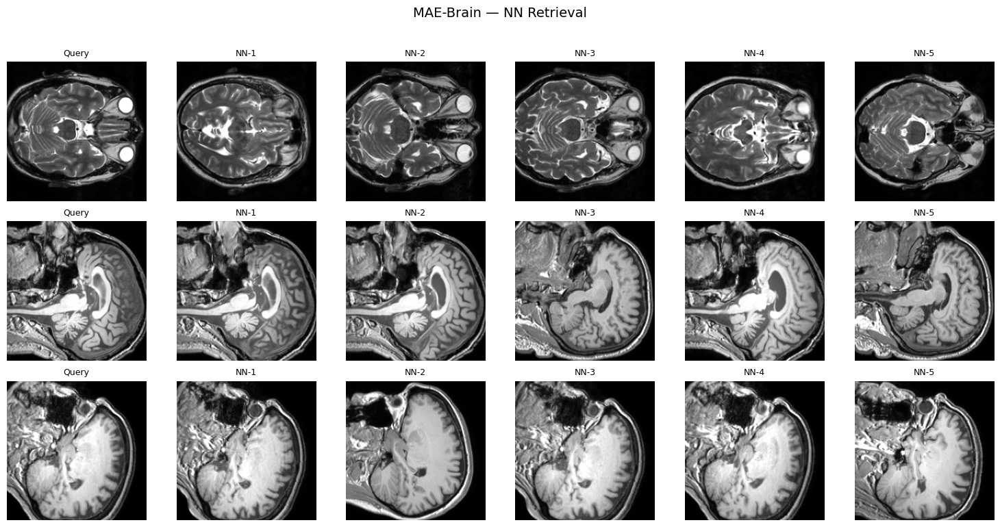

[12/12] Top anomalies...


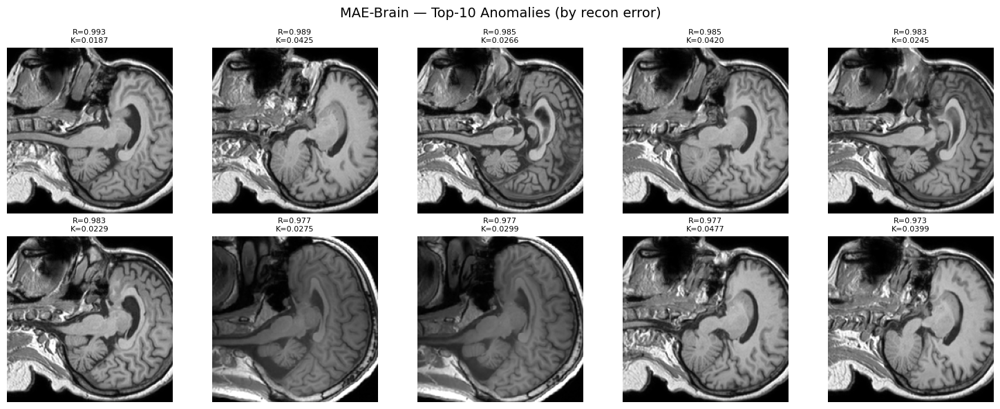


  ✅ Analysis complete in 1.6 min
  📁 Files: ['anomaly_scores.png', 'epoch_20.pt', 'top_anomalies.png', 'training_curves.png', 'similarity_dist.png', 'epoch_15.pt', 'nn_retrieval.png', 'epoch_5.pt', 'scoring.npz', 'epoch_10.pt', 'reconstruction_viz.png', 'best.pt', 'final.pt', 'tsne.png']
⏱ [ANALYSIS END MAE-Brain] Elapsed: 0.37h | Remaining: 11.63h | Budget used: 3.1%


In [18]:
# ══════════════════════════════════════════════
# PART 2: BRAIN — Full Analysis
# ══════════════════════════════════════════════
brain_results = run_full_analysis(
    brain_model, brain_train_clean_loader, brain_val_clean_loader,
    brain_val_clean, brain_history, BRAIN_SAVE, "MAE-Brain")

In [19]:
# ══════════════════════════════════════════════
# PART 2: BRAIN — Cleanup
# ══════════════════════════════════════════════
del brain_model
del brain_train_loader, brain_val_loader
del brain_train_clean_loader, brain_val_clean_loader
clear_gpu()

  🖥 GPU [after clear]: 0.02/15.6 GB (peak: 0.02 GB)
⏱ [GPU cleared] Elapsed: 0.37h | Remaining: 11.63h | Budget used: 3.1%


---
# Part 3: Combined (Knee + Balanced Brain)

Train ViT-MAE on **both anatomies merged**.
- Knee: ~12,864 + Brain: ~12,864 = ~25,728 total
- 3 classes: KNEE, T1, T2
- Multi-anatomy generalist model

In [20]:
# ══════════════════════════════════════════════
# PART 3: COMBINED — Data Loaders
# ══════════════════════════════════════════════
print("Loading Combined (Knee + balanced Brain) datasets...")
aug = MAEAugment()

comb_train_paths = knee_train_paths + brain_train_paths
comb_train_labels = knee_train_labels + brain_train_labels
comb_val_paths = knee_val_paths + brain_val_paths
comb_val_labels = knee_val_labels + brain_val_labels

comb_train_ds = MRIDataset(comb_train_paths, comb_train_labels, combined_label_map,
                           transform=aug, name="Combined-Train")
comb_val_ds = MRIDataset(comb_val_paths, comb_val_labels, combined_label_map,
                         transform=aug, name="Combined-Val")

comb_train_loader = DataLoader(comb_train_ds, batch_size=BATCH_SIZE, shuffle=True,
                               num_workers=NUM_WORKERS, pin_memory=True, drop_last=True)
comb_val_loader = DataLoader(comb_val_ds, batch_size=BATCH_SIZE, shuffle=False,
                             num_workers=NUM_WORKERS, pin_memory=True)

comb_train_clean = MRIDataset(comb_train_paths, comb_train_labels, combined_label_map,
                              name="Combined-Train-Clean")
comb_val_clean = MRIDataset(comb_val_paths, comb_val_labels, combined_label_map,
                            name="Combined-Val-Clean")

comb_train_clean_loader = DataLoader(comb_train_clean, batch_size=BATCH_SIZE, shuffle=False,
                                     num_workers=NUM_WORKERS, pin_memory=True)
comb_val_clean_loader = DataLoader(comb_val_clean, batch_size=BATCH_SIZE, shuffle=False,
                                   num_workers=NUM_WORKERS, pin_memory=True)

print(f"\nCombined train: {len(comb_train_ds)} slices, {len(comb_train_loader)} batches")
print(f"Combined val:   {len(comb_val_ds)} slices, {len(comb_val_loader)} batches")

Loading Combined (Knee + balanced Brain) datasets...
  [Combined-Train] 25728 slices | Labels: {'KNEE': 0, 'T1': 1, 'T2': 2}
  [Combined-Val] 6528 slices | Labels: {'KNEE': 0, 'T1': 1, 'T2': 2}
  [Combined-Train-Clean] 25728 slices | Labels: {'KNEE': 0, 'T1': 1, 'T2': 2}
  [Combined-Val-Clean] 6528 slices | Labels: {'KNEE': 0, 'T1': 1, 'T2': 2}

Combined train: 25728 slices, 402 batches
Combined val:   6528 slices, 102 batches


In [21]:
# ══════════════════════════════════════════════
# PART 3: COMBINED — Train MAE
# ══════════════════════════════════════════════
COMBINED_SAVE = "/kaggle/working/checkpoints/mae_combined"
comb_model, comb_history = train_mae(
    comb_train_loader, comb_val_loader, COMBINED_SAVE, model_name="MAE-Combined")

⏱ [START MAE-Combined] Elapsed: 0.37h | Remaining: 11.63h | Budget used: 3.1%

  🚀 Training: MAE-Combined
  📁 Save dir: /kaggle/working/checkpoints/mae_combined
  📊 Train: 402 batches | Val: 102 batches
  ⚙️  Config: 20ep, BS=64, accum=4, mask=0.75, LR=0.00015

  Parameters: 23,380,288 (23.4M)
  🖥 GPU [model loaded]: 0.11/15.6 GB (peak: 0.11 GB)
  [MAE-Combined] Epoch  1/20 │ train=0.9544 val=0.9531 │ lr=0.000150 │ 41s/ep │ model: 0.7min │ budget left: 11.62h
       ↑ New best! (val_loss=0.9531)
  [MAE-Combined] Epoch  2/20 │ train=0.9307 val=0.9258 │ lr=0.000150 │ 40s/ep │ model: 1.3min │ budget left: 11.60h
       ↑ New best! (val_loss=0.9258)
  [MAE-Combined] Epoch  3/20 │ train=0.9174 val=0.9164 │ lr=0.000149 │ 40s/ep │ model: 2.0min │ budget left: 11.59h
       ↑ New best! (val_loss=0.9164)
  [MAE-Combined] Epoch  4/20 │ train=0.9093 val=0.9106 │ lr=0.000145 │ 40s/ep │ model: 2.7min │ budget left: 11.58h
       ↑ New best! (val_loss=0.9106)
  [MAE-Combined] Epoch  5/20 │ train=0.9

⏱ [ANALYSIS START MAE-Combined] Elapsed: 0.60h | Remaining: 11.40h | Budget used: 5.0%

  📈 Analysis: MAE-Combined

[1/12] Training curves...


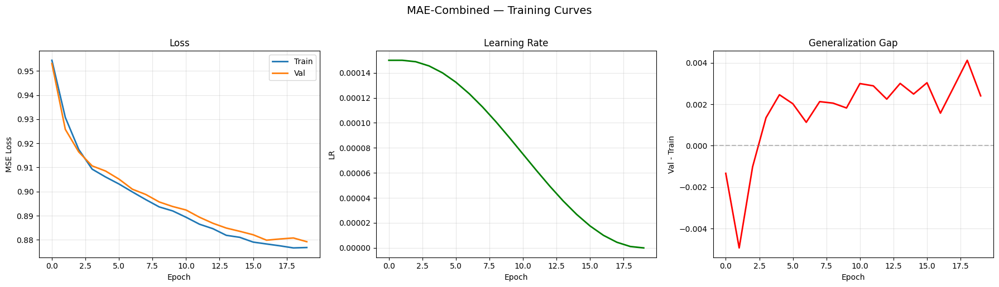

[2/12] Reconstruction visualization...


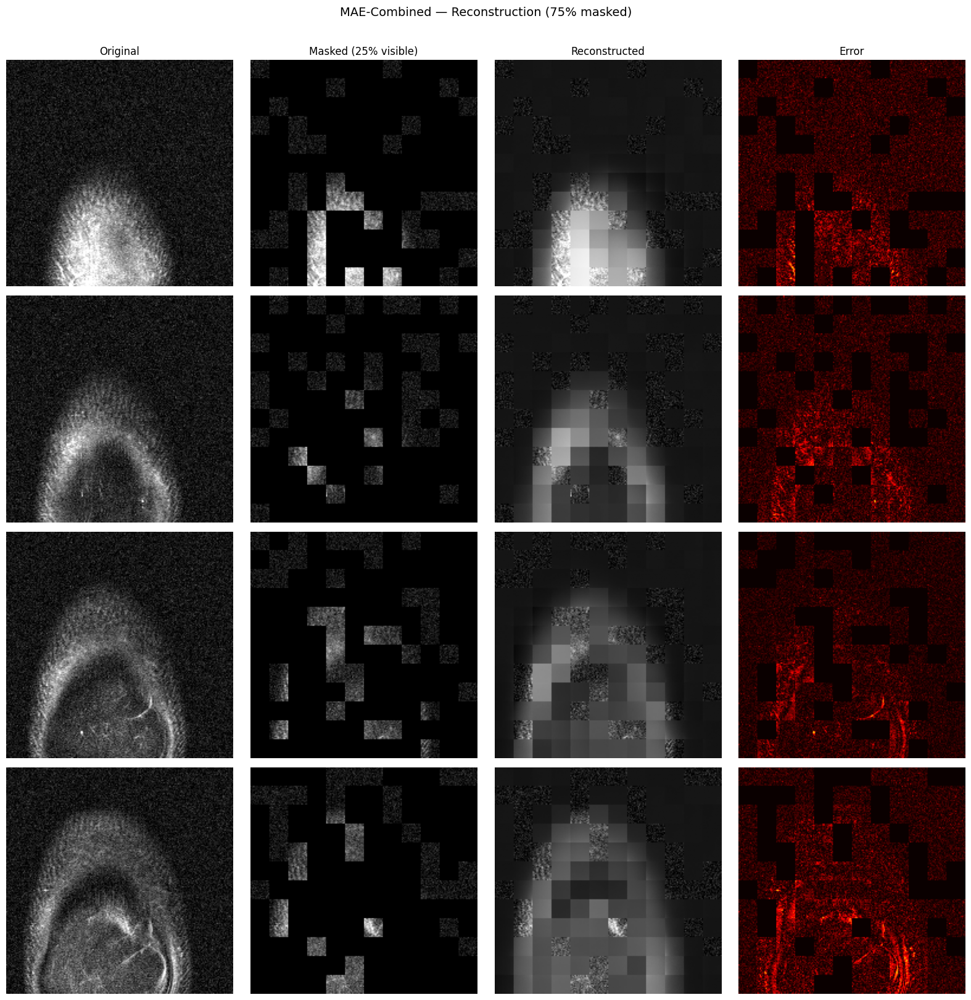

[3/12] Extracting encoder features (no masking)...


Extracting features: 100%|██████████| 102/102 [00:05<00:00, 18.47it/s]


  Train: (25728, 384), Val: (6528, 384) (25.9s)
[4/12] Collapse check...
  Train: STD=0.0424 ✅ | Mean cos sim=0.2701 ✅
  Val: STD=0.0413 ✅ | Mean cos sim=0.3047 ✅
[5/12] Reconstruction anomaly scores (10 trials)...


Recon scoring: 100%|██████████| 102/102 [00:23<00:00,  4.39it/s]


  Train recon — mean: 0.8876, std: 0.0851
  Val recon   — mean: 0.8913, std: 0.0855
  (114.1s)
[6/12] Feature kNN anomaly scores...
  Train kNN — mean: 0.0180, std: 0.0177
  Val kNN   — mean: 0.0276, std: 0.0310
[7/12] Score distributions...


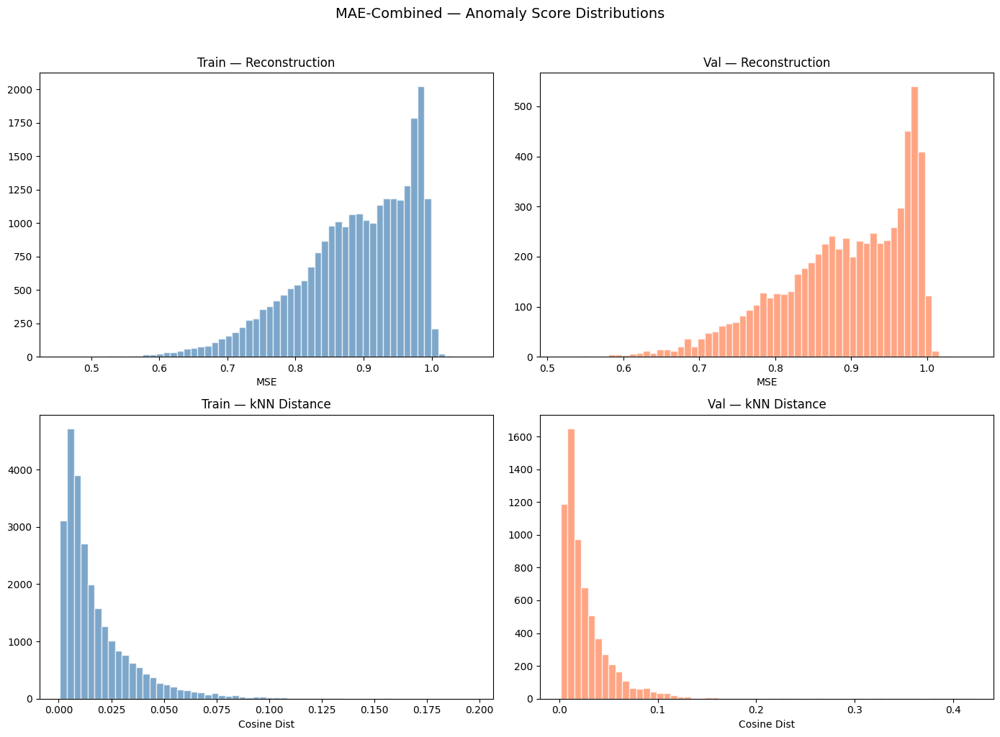

[8/12] Threshold analysis...
  Reconstruction-based:
    p90: thresh=0.9832 → 817/6528 val flagged (12.5%)
    p95: thresh=0.9900 → 427/6528 val flagged (6.5%)
    p97.5: thresh=0.9945 → 213/6528 val flagged (3.3%)
    p99: thresh=0.9990 → 93/6528 val flagged (1.4%)
  kNN-based:
    p90: thresh=0.0404 → 1304/6528 val flagged (20.0%)
    p95: thresh=0.0538 → 774/6528 val flagged (11.9%)
    p97.5: thresh=0.0671 → 464/6528 val flagged (7.1%)
    p99: thresh=0.0843 → 294/6528 val flagged (4.5%)
[9/12] t-SNE...
  t-SNE done (13.3s)


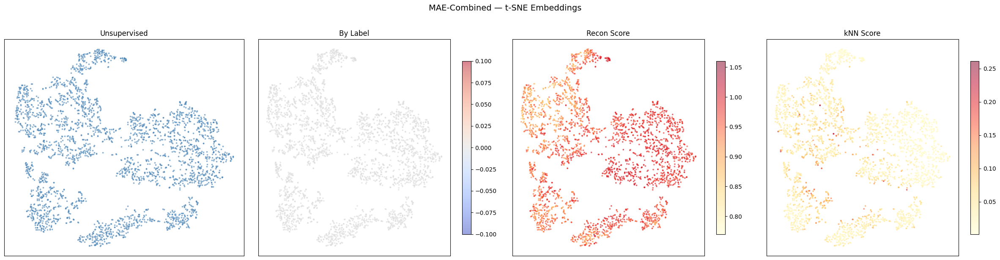

[10/12] Cosine similarity distribution...


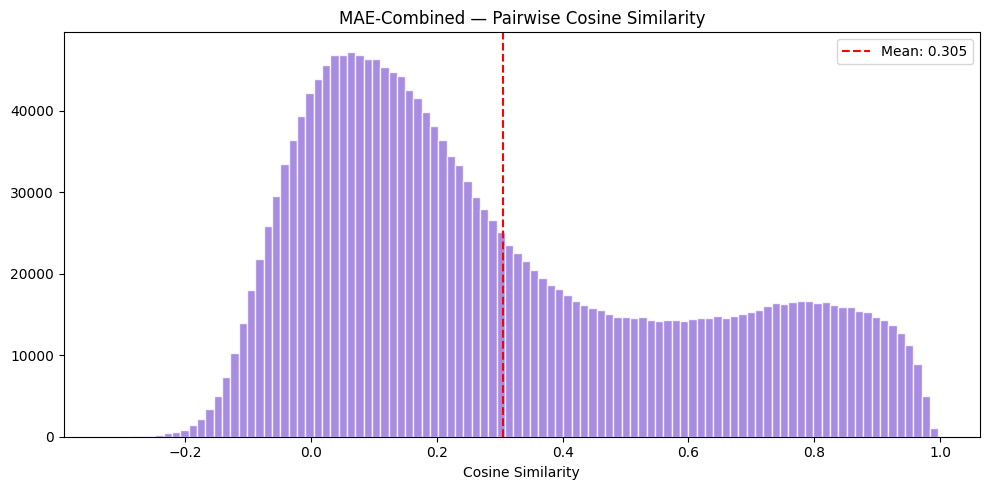

[11/12] Nearest neighbor retrieval...


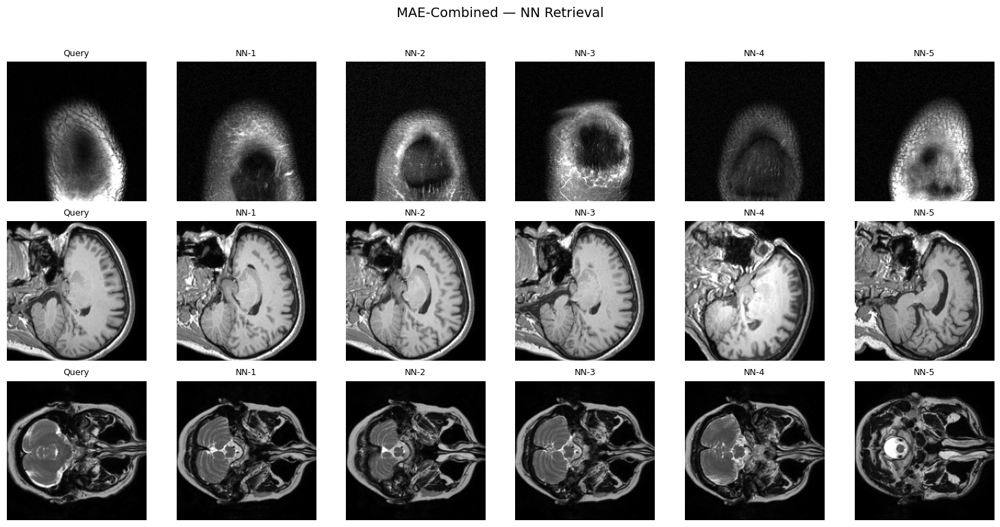

[12/12] Top anomalies...


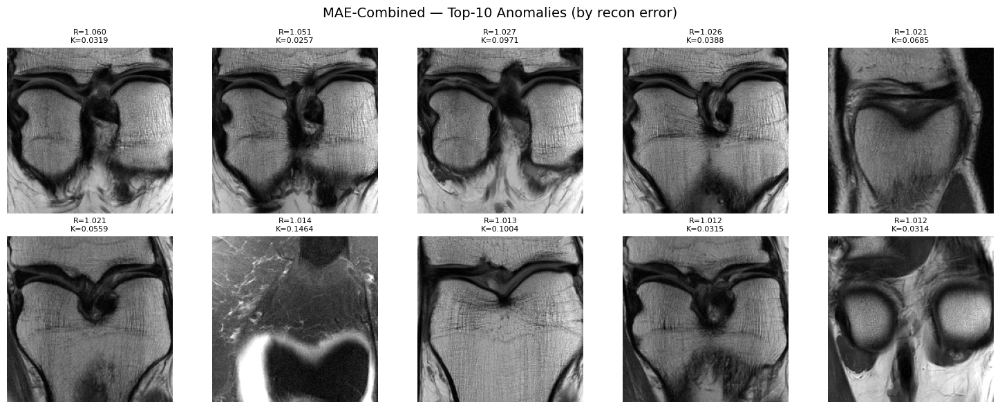


  ✅ Analysis complete in 2.9 min
  📁 Files: ['anomaly_scores.png', 'epoch_20.pt', 'top_anomalies.png', 'training_curves.png', 'similarity_dist.png', 'epoch_15.pt', 'nn_retrieval.png', 'epoch_5.pt', 'scoring.npz', 'epoch_10.pt', 'reconstruction_viz.png', 'best.pt', 'final.pt', 'tsne.png']
⏱ [ANALYSIS END MAE-Combined] Elapsed: 0.65h | Remaining: 11.35h | Budget used: 5.4%


In [22]:
# ══════════════════════════════════════════════
# PART 3: COMBINED — Full Analysis
# ══════════════════════════════════════════════
comb_results = run_full_analysis(
    comb_model, comb_train_clean_loader, comb_val_clean_loader,
    comb_val_clean, comb_history, COMBINED_SAVE, "MAE-Combined")

In [23]:
# ══════════════════════════════════════════════
# PART 3: COMBINED — Cleanup
# ══════════════════════════════════════════════
del comb_model
del comb_train_loader, comb_val_loader
del comb_train_clean_loader, comb_val_clean_loader
clear_gpu()

  🖥 GPU [after clear]: 0.02/15.6 GB (peak: 0.02 GB)
⏱ [GPU cleared] Elapsed: 0.65h | Remaining: 11.35h | Budget used: 5.4%


---
# Summary & Comparison

Compare the three MAE models side-by-side on key metrics:
- Reconstruction error (anomaly score)
- Feature-based kNN distance (anomaly score)
- Feature diversity (collapse check)
- Generalization gap

In [24]:
# ══════════════════════════════════════════════
# Cross-Model Comparison
# ══════════════════════════════════════════════
print("\n" + "=" * 80)
print("  MAE MODEL COMPARISON SUMMARY")
print("=" * 80)

results = {}
for name, save_dir in [("Knee", KNEE_SAVE), ("Brain", BRAIN_SAVE), ("Combined", COMBINED_SAVE)]:
    data = np.load(os.path.join(save_dir, "scoring.npz"), allow_pickle=True)
    results[name] = {
        "train_recon": data["train_recon"],
        "val_recon": data["val_recon"],
        "train_knn": data["train_knn"],
        "val_knn": data["val_knn"],
        "val_feats": data["val_feats"],
        "thresh_recon": float(data["threshold_recon_p95"]),
        "thresh_knn": float(data["threshold_knn_p95"]),
    }

# Reconstruction scores
print(f"\n{'Model':<12} {'Train μ':<10} {'Val μ':<10} {'Val σ':<10} {'p95 Thresh':<12} {'Val>p95':}")
print("-" * 70)
for name, r in results.items():
    tr, vr = r["train_recon"], r["val_recon"]
    flagged = (vr > r["thresh_recon"]).sum()
    print(f"{name:<12} {tr.mean():<10.4f} {vr.mean():<10.4f} {vr.std():<10.4f} "
          f"{r['thresh_recon']:<12.4f} {flagged}/{len(vr)} ({100*flagged/len(vr):.1f}%)")

# kNN scores
print(f"\n{'Model':<12} {'Train μ':<10} {'Val μ':<10} {'Val σ':<10} {'p95 Thresh':<12} {'Val>p95':}")
print("-" * 70)
for name, r in results.items():
    tr, vr = r["train_knn"], r["val_knn"]
    flagged = (vr > r["thresh_knn"]).sum()
    print(f"{name:<12} {tr.mean():<10.4f} {vr.mean():<10.4f} {vr.std():<10.4f} "
          f"{r['thresh_knn']:<12.4f} {flagged}/{len(vr)} ({100*flagged/len(vr):.1f}%)")

# Feature diversity
print(f"\n{'Model':<12} {'Feature STD':<14} {'Mean Cos Sim':<14} {'Status'}")
print("-" * 54)
for name, r in results.items():
    feats = r["val_feats"][:2000]
    std = np.std(feats, axis=0).mean()
    sim = np.dot(feats, feats.T)
    off = sim[np.triu_indices_from(sim, k=1)].mean()
    status = "✅ Good" if off < 0.9 else "⚠️ High sim"
    print(f"{name:<12} {std:<14.4f} {off:<14.4f} {status}")


  MAE MODEL COMPARISON SUMMARY

Model        Train μ    Val μ      Val σ      p95 Thresh   Val>p95
----------------------------------------------------------------------
Knee         0.9564     0.9606     0.0309     0.9951       238/3264 (7.3%)
Brain        0.8332     0.8358     0.0670     0.9242       195/3264 (6.0%)
Combined     0.8876     0.8913     0.0855     0.9900       427/6528 (6.5%)

Model        Train μ    Val μ      Val σ      p95 Thresh   Val>p95
----------------------------------------------------------------------
Knee         0.0122     0.0165     0.0136     0.0304       417/3264 (12.8%)
Brain        0.0072     0.0148     0.0295     0.0178       544/3264 (16.7%)
Combined     0.0180     0.0276     0.0310     0.0538       774/6528 (11.9%)

Model        Feature STD    Mean Cos Sim   Status
------------------------------------------------------
Knee         0.0404         0.3246         ✅ Good
Brain        0.0407         0.3089         ✅ Good
Combined     0.0413         0.3

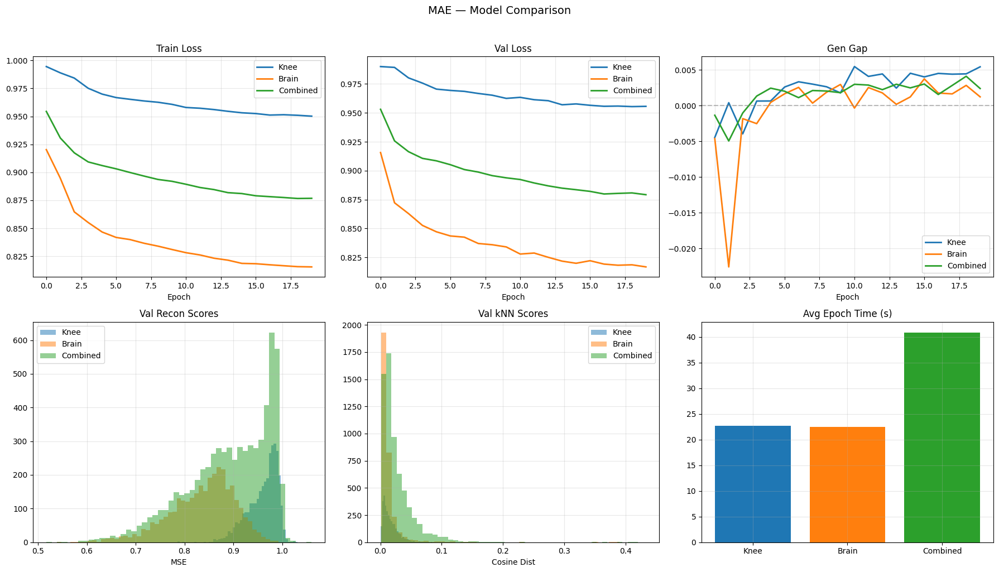

In [25]:
# ══════════════════════════════════════════════
# Comparative Plots
# ══════════════════════════════════════════════
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle("MAE — Model Comparison", fontsize=14, y=1.02)

colors = {"Knee": "tab:blue", "Brain": "tab:orange", "Combined": "tab:green"}

# Load histories
histories = {}
for name, save_dir in [("Knee", KNEE_SAVE), ("Brain", BRAIN_SAVE), ("Combined", COMBINED_SAVE)]:
    ckpt = torch.load(os.path.join(save_dir, "final.pt"), map_location="cpu")
    histories[name] = ckpt["history"]

# Row 1: Loss curves
for name, h in histories.items():
    axes[0][0].plot(h['train_loss'], label=name, linewidth=2, color=colors[name])
axes[0][0].set_title('Train Loss'); axes[0][0].set_xlabel('Epoch')
axes[0][0].legend(); axes[0][0].grid(True, alpha=0.3)

for name, h in histories.items():
    axes[0][1].plot(h['val_loss'], label=name, linewidth=2, color=colors[name])
axes[0][1].set_title('Val Loss'); axes[0][1].set_xlabel('Epoch')
axes[0][1].legend(); axes[0][1].grid(True, alpha=0.3)

for name, h in histories.items():
    g = [v - t for t, v in zip(h['train_loss'], h['val_loss'])]
    axes[0][2].plot(g, label=name, linewidth=2, color=colors[name])
axes[0][2].set_title('Gen Gap'); axes[0][2].set_xlabel('Epoch')
axes[0][2].axhline(0, color='gray', ls='--', alpha=0.5)
axes[0][2].legend(); axes[0][2].grid(True, alpha=0.3)

# Row 2: Score distributions
for name, r in results.items():
    axes[1][0].hist(r['val_recon'], bins=50, alpha=0.5, label=name, color=colors[name])
axes[1][0].set_title('Val Recon Scores'); axes[1][0].set_xlabel('MSE')
axes[1][0].legend(); axes[1][0].grid(True, alpha=0.3)

for name, r in results.items():
    axes[1][1].hist(r['val_knn'], bins=50, alpha=0.5, label=name, color=colors[name])
axes[1][1].set_title('Val kNN Scores'); axes[1][1].set_xlabel('Cosine Dist')
axes[1][1].legend(); axes[1][1].grid(True, alpha=0.3)

# Epoch time comparison
for name, h in histories.items():
    axes[1][2].bar(name, np.mean(h['epoch_time']), color=colors[name])
axes[1][2].set_title('Avg Epoch Time (s)'); axes[1][2].grid(True, alpha=0.3)

fig.tight_layout()
fig.savefig('mae_comparison_plots.png', dpi=150, bbox_inches='tight')
plt.show()

---
## Download All Checkpoints

In [26]:
# # ══════════════════════════════════════════════
# # Zip & Download All Checkpoints
# # ══════════════════════════════════════════════
# import shutil
# from IPython.display import FileLink, display

# for name, save_dir in [("knee", KNEE_SAVE), ("brain", BRAIN_SAVE), ("combined", COMBINED_SAVE)]:
#     zip_path = shutil.make_archive(f"mae_{name}_checkpoints", "zip",
#                                    root_dir=".", base_dir=save_dir)
#     size_mb = os.path.getsize(zip_path) / 1e6
#     print(f"  {name}: {zip_path} ({size_mb:.1f} MB)")
#     display(FileLink(zip_path))

# all_zip = shutil.make_archive("mae_all_checkpoints", "zip",
#                               root_dir=".", base_dir="checkpoints")
# print(f"\n  ALL: {all_zip} ({os.path.getsize(all_zip)/1e6:.1f} MB)")
# display(FileLink(all_zip))